# Wasserstein GAN with Gradient Penalty (WGAN-GP)

### Goals
In this notebook, you're going to build a Wasserstein GAN with Gradient Penalty (WGAN-GP) that solves some of the stability issues with the GANs that you have been using up until this point. Specifically, you'll use a special kind of loss function known as the W-loss, where W stands for Wasserstein, and gradient penalties to prevent mode collapse.

*Fun Fact: Wasserstein is named after a mathematician at Penn State, Leonid Vaseršteĭn. You'll see it abbreviated to W (e.g. WGAN, W-loss, W-distance).*

### Learning Objectives
1.   Get hands-on experience building a more stable GAN: Wasserstein GAN with Gradient Penalty (WGAN-GP).
2.   Train the more advanced WGAN-GP model.



## Generator and Critic

You will begin by importing some useful packages, defining visualization functions, building the generator, and building the critic. Since the changes for WGAN-GP are done to the loss function during training, you can simply reuse your previous GAN code for the generator and critic class. Remember that in WGAN-GP, you no longer use a discriminator that classifies fake and real as 0 and 1 but rather a critic that scores images with real numbers.

#### Packages and Visualizations

In [2]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.
    '''
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    '''
    grads = []
    def grad_hook(m):
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

#### Generator and Noise

In [3]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN;
        a transposed convolution, a batchnorm (except in the final layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True),
            )
        else:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh(),
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor,
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
      n_samples: the number of samples to generate, a scalar
      z_dim: the dimension of the noise vector, a scalar
      device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

#### Critic

In [4]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Initializations
Now you can start putting it all together.
As usual, you will start by setting the parameters:
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   beta_1, beta_2: the momentum terms
  *   c_lambda: weight of the gradient penalty
  *   crit_repeats: number of times to update the critic per generator update - there are more details about this in the *Putting It All Together* section
  *   device: the device type

You will also load and transform the MNIST dataset to tensors.




In [5]:
n_epochs = 100
z_dim = 64
display_step = 50
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
c_lambda = 10
crit_repeats = 5
device = 'cuda'

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True)

Then, you can initialize your generator, critic, and optimizers.

In [6]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)


## Gradient Penalty
Calculating the gradient penalty can be broken into two functions: (1) compute the gradient with respect to the images and (2) compute the gradient penalty given the gradient.

You can start by getting the gradient. The gradient is computed by first creating a mixed image. This is done by weighing the fake and real image using epsilon and then adding them together. Once you have the intermediate image, you can get the critic's output on the image. Finally, you compute the gradient of the critic score's on the mixed images (output) with respect to the pixels of the mixed images (input). You will need to fill in the code to get the gradient wherever you see *None*. There is a test function in the next block for you to test your solution.

In [7]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gradient
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        # Note: You need to take the gradient of outputs with respect to inputs.
        # This documentation may be useful, but it should not be necessary:
        # https://pytorch.org/docs/stable/autograd.html#torch.autograd.grad
        #### START CODE HERE ####
        inputs=mixed_images,
        outputs=mixed_scores,
        #### END CODE HERE ####
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient


In [8]:
# UNIT TEST
# DO NOT MODIFY THIS
def test_get_gradient(image_shape):
    real = torch.randn(*image_shape, device=device) + 1
    fake = torch.randn(*image_shape, device=device) - 1
    epsilon_shape = [1 for _ in image_shape]
    epsilon_shape[0] = image_shape[0]
    epsilon = torch.rand(epsilon_shape, device=device).requires_grad_()
    gradient = get_gradient(crit, real, fake, epsilon)
    assert tuple(gradient.shape) == image_shape
    assert gradient.max() > 0
    assert gradient.min() < 0
    return gradient

gradient = test_get_gradient((256, 1, 28, 28))
print("Success!")

Success!


The second function you need to complete is to compute the gradient penalty given the gradient. First, you calculate the magnitude of each image's gradient. The magnitude of a gradient is also called the norm. Then, you calculate the penalty by squaring the distance between each magnitude and the ideal norm of 1 and taking the mean of all the squared distances.

Again, you will need to fill in the code wherever you see *None*. There are hints below that you can view if you need help and there is a test function in the next block for you to test your solution.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">gradient_penalty</font></code></b>
</font>
</summary>


1.   Make sure you take the mean at the end.
2.   Note that the magnitude of each gradient has already been calculated for you.

</details>


In [15]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: gradient_penalty
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.
    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.
    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    #### START CODE HERE ####
    penalty = ((gradient_norm - torch.ones_like(gradient_norm))**2).mean()
    #### END CODE HERE ####
    return penalty

In [16]:
# UNIT TEST
def test_gradient_penalty(image_shape):
    bad_gradient = torch.zeros(*image_shape)
    bad_gradient_penalty = gradient_penalty(bad_gradient)
    assert torch.isclose(bad_gradient_penalty, torch.tensor(1.))

    image_size = torch.prod(torch.Tensor(image_shape[1:]))
    good_gradient = torch.ones(*image_shape) / torch.sqrt(image_size)
    good_gradient_penalty = gradient_penalty(good_gradient)
    assert torch.isclose(good_gradient_penalty, torch.tensor(0.))

    random_gradient = test_get_gradient(image_shape)
    random_gradient_penalty = gradient_penalty(random_gradient)
    assert torch.abs(random_gradient_penalty - 1) < 0.1

test_gradient_penalty((256, 1, 28, 28))
print("Success!")

Success!


## Losses
Next, you need to calculate the loss for the generator and the critic.

For the generator, the loss is calculated by maximizing the critic's prediction on the generator's fake images. The argument has the scores for all fake images in the batch, but you will use the mean of them.

There are optional hints below and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_gen_loss</font></code></b></font></summary>

1. This can be written in one line.
2. This is the negative of the mean of the critic's scores.

</details>

In [17]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    #### START CODE HERE ####
    gen_loss = -crit_fake_pred.mean()
    #### END CODE HERE ####
    return gen_loss

In [18]:
# UNIT TEST
assert torch.isclose(
    get_gen_loss(torch.tensor(1.)), torch.tensor(-1.0)
)

assert torch.isclose(
    get_gen_loss(torch.rand(10000)), torch.tensor(-0.5), 0.05
)

print("Success!")

Success!


For the critic, the loss is calculated by maximizing the distance between the critic's predictions on the real images and the predictions on the fake images while also adding a gradient penalty. The gradient penalty is weighed according to lambda. The arguments are the scores for all the images in the batch, and you will use the mean of them.

There are hints below if you get stuck and a test function in the next block for you to test your solution.

<details><summary><font size="3" color="green"><b>Optional hints for <code><font size="4">get_crit_loss</font></code></b></font></summary>

1. The higher the mean fake score, the higher the critic's loss is.
2. What does this suggest about the mean real score?
3. The higher the gradient penalty, the higher the critic's loss is, proportional to lambda.


</details>


In [19]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_crit_loss
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.
    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 
    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    #### START CODE HERE ####
    crit_loss = crit_fake_pred.mean() - crit_real_pred.mean() + c_lambda*gp
    #### END CODE HERE ####
    return crit_loss

In [20]:
# UNIT TEST
assert torch.isclose(
    get_crit_loss(torch.tensor(1.), torch.tensor(2.), torch.tensor(3.), 0.1),
    torch.tensor(-0.7)
)
assert torch.isclose(
    get_crit_loss(torch.tensor(20.), torch.tensor(-20.), torch.tensor(2.), 10),
    torch.tensor(60.)
)

print("Success!")

Success!


## Putting It All Together
Before you put everything together, there are a few things to note.
1.   Even on GPU, the **training will run more slowly** than previous labs because the gradient penalty requires you to compute the gradient of a gradient -- this means potentially a few minutes per epoch! For best results, run this for as long as you can while on GPU.
2.   One important difference from earlier versions is that you will **update the critic multiple times** every time you update the generator This helps prevent the generator from overpowering the critic. Sometimes, you might see the reverse, with the generator updated more times than the critic. This depends on architectural (e.g. the depth and width of the network) and algorithmic choices (e.g. which loss you're using). 
3.   WGAN-GP isn't necessarily meant to improve overall performance of a GAN, but just **increases stability** and avoids mode collapse. In general, a WGAN will be able to train in a much more stable way than the vanilla DCGAN from last assignment, though it will generally run a bit slower. You should also be able to train your model for more epochs without it collapsing.


<!-- Once again, be warned that this runs very slowly on a CPU. One way to run this more quickly is to download the .ipynb and upload it to Google Drive, then open it with Google Colab and make the runtime type GPU and replace
`device = "cpu"`
with
`device = "cuda"`
and make sure that your `get_noise` function uses the right device.  -->

Here is a snapshot of what your WGAN-GP outputs should resemble:
![MNIST Digits Progression](MNIST_WGAN_Progression.png)

Step 50: Generator loss: -0.09717934460612014, critic loss: 1.917897291153669


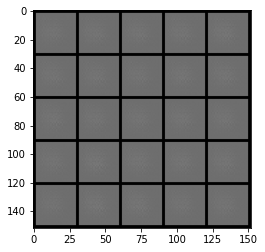

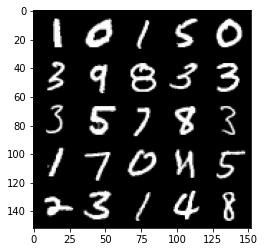

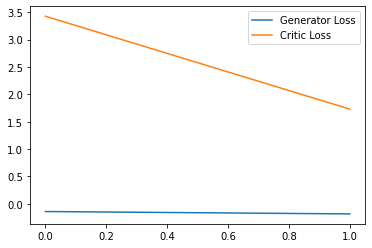

Step 100: Generator loss: 0.7609773142635823, critic loss: -1.7301596244573594


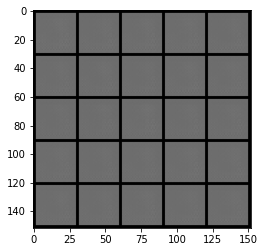

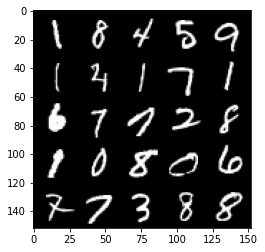

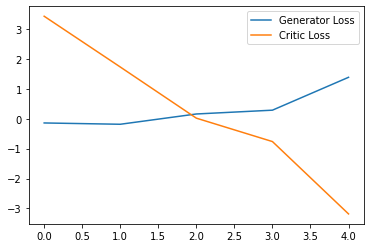

Step 150: Generator loss: 3.1235690853744744, critic loss: -11.840916732788084


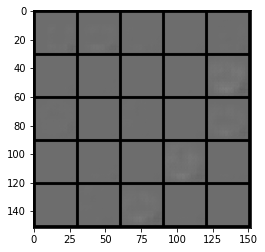

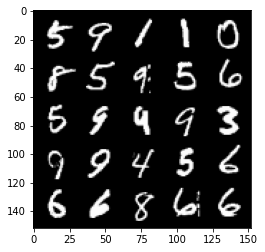

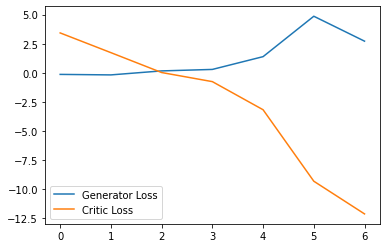

Step 200: Generator loss: -1.627431811094284, critic loss: -26.96159047317505


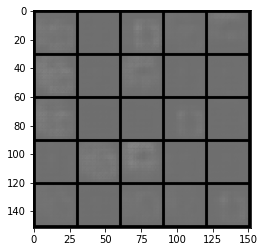

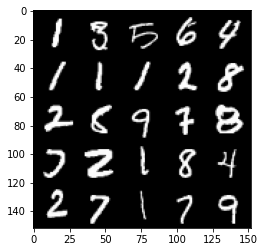

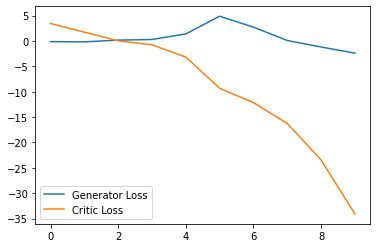

Step 250: Generator loss: -3.324313471317291, critic loss: -57.74204033660889


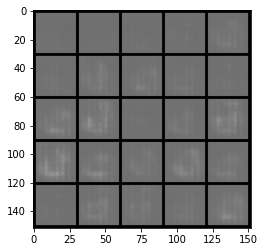

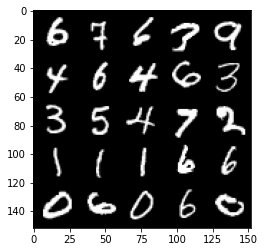

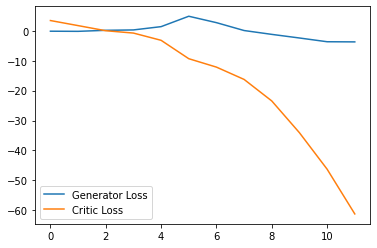

Step 300: Generator loss: -2.060034248828888, critic loss: -98.97689187622069


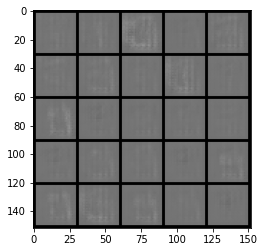

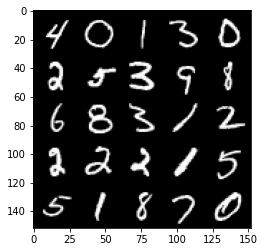

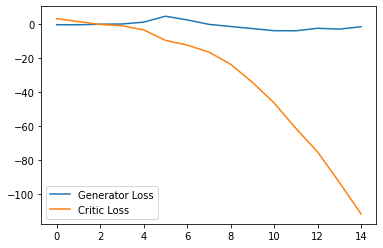

Step 350: Generator loss: 1.9335703146457672, critic loss: -147.21982754516603


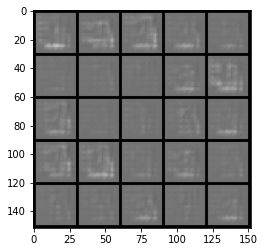

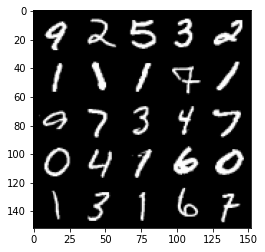

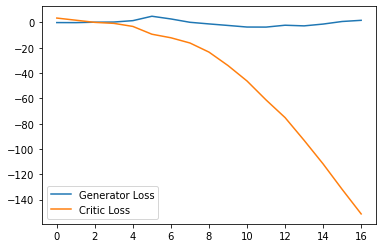

Step 400: Generator loss: 2.421329674720764, critic loss: -201.77290496826183


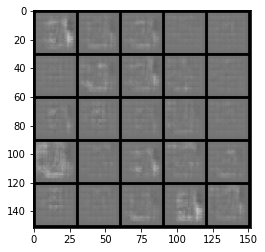

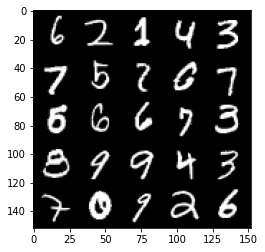

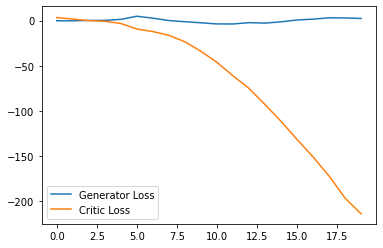

Step 450: Generator loss: 1.8808636552095412, critic loss: -241.79140362548821


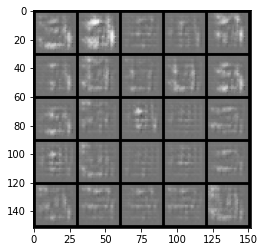

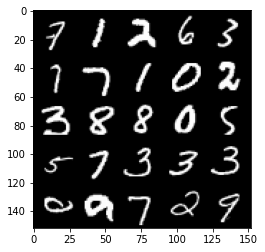

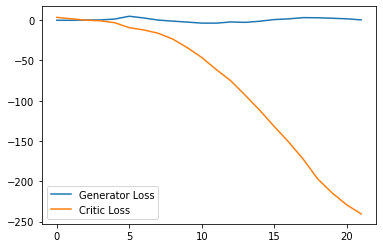

Step 500: Generator loss: 2.966242804527283, critic loss: -284.7694473876952


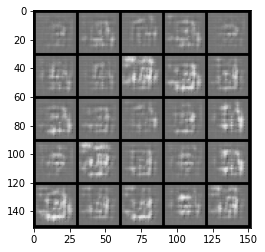

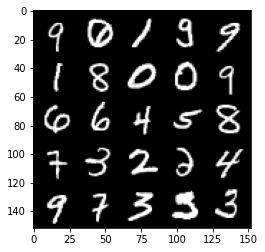

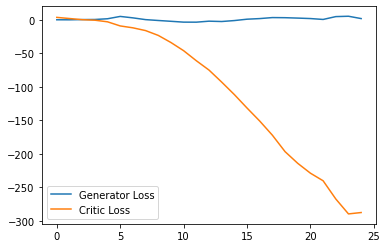

Step 550: Generator loss: -21.336298008561133, critic loss: -252.43245295715332


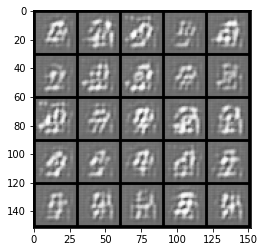

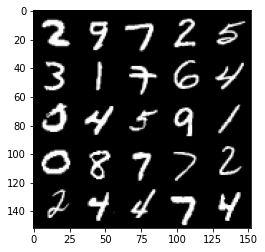

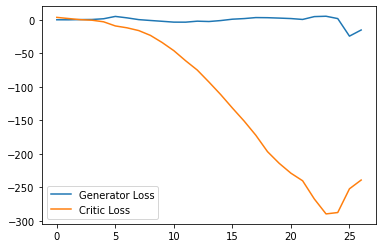

Step 600: Generator loss: -5.744106740951538, critic loss: -309.76107296752923


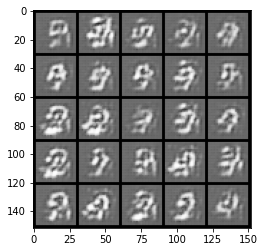

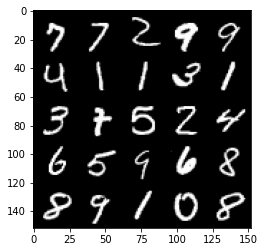

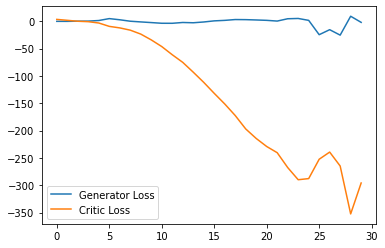

Step 650: Generator loss: 1.1067803192138672, critic loss: -306.3799274597167


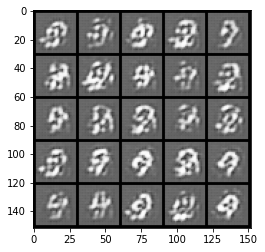

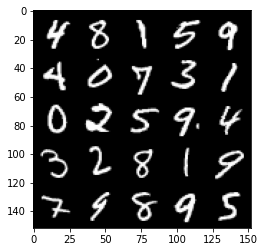

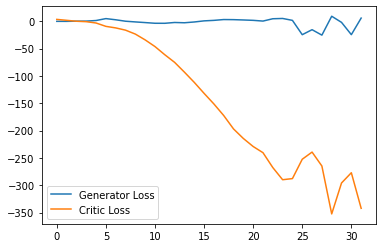

Step 700: Generator loss: -5.092107939720154, critic loss: -298.14540686035156


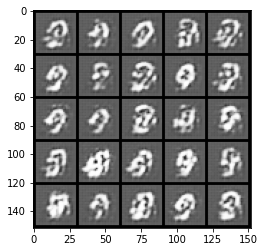

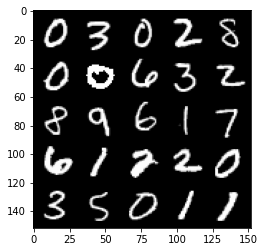

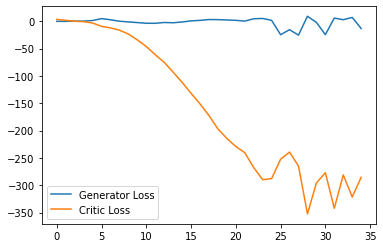

Step 750: Generator loss: 8.524578638076783, critic loss: -326.89202392578125


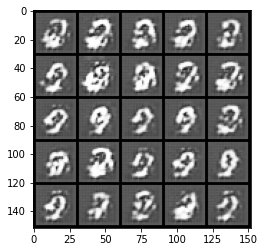

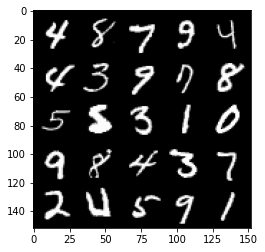

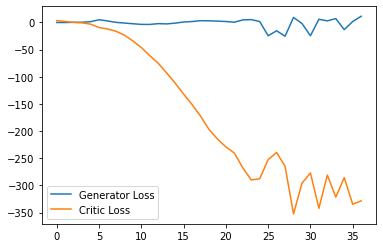

Step 800: Generator loss: -16.786527075767516, critic loss: -274.408492553711


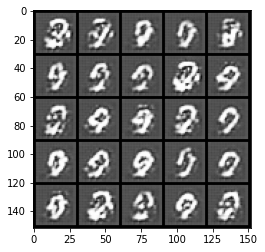

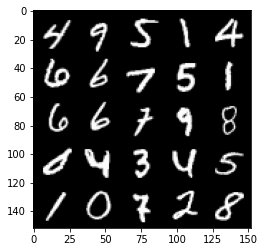

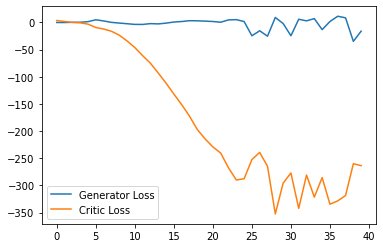

Step 850: Generator loss: -23.852703211307524, critic loss: -221.51937185668942


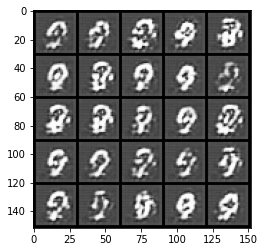

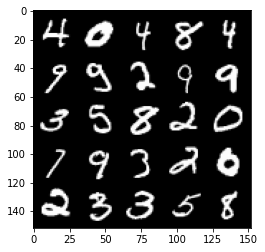

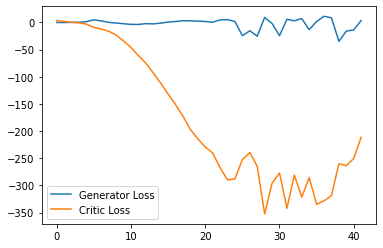

Step 900: Generator loss: -43.52511260509491, critic loss: -185.53153042602545


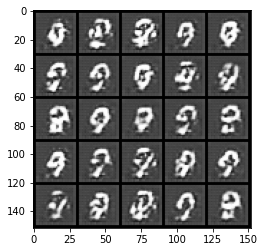

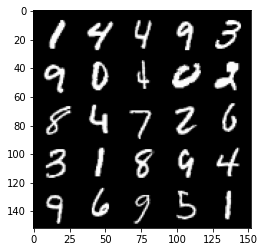

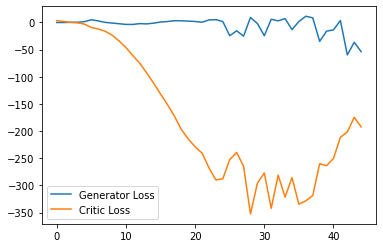

Step 950: Generator loss: -31.171902215480806, critic loss: -120.70134721374514


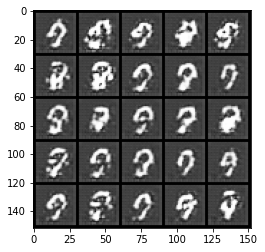

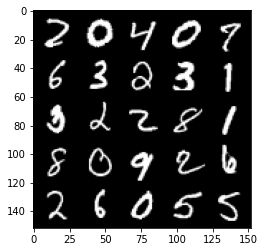

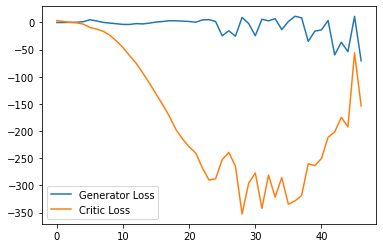

Step 1000: Generator loss: -36.15810171127319, critic loss: -162.06067181396486


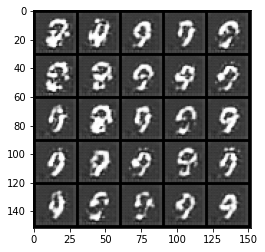

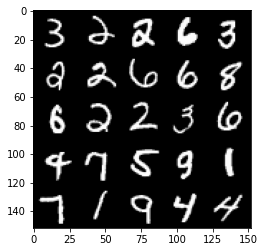

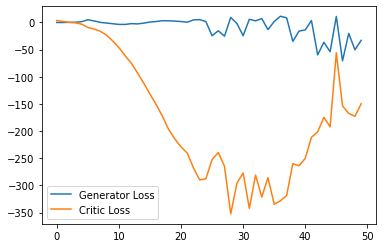

Step 1050: Generator loss: -7.394808061122895, critic loss: -37.1637043800354


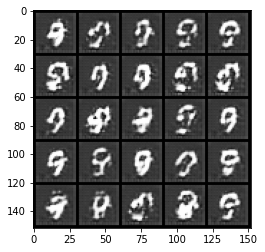

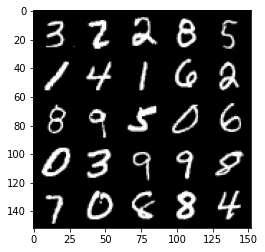

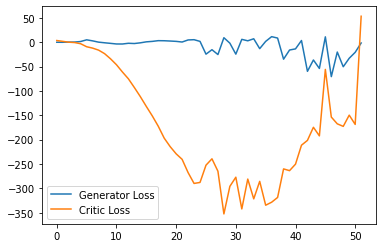

Step 1100: Generator loss: 7.635119967460632, critic loss: 18.652656219482424


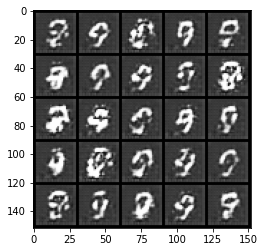

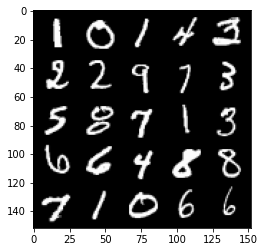

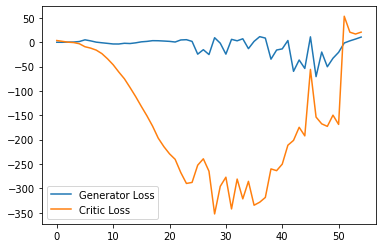

Step 1150: Generator loss: 12.160774955749512, critic loss: 18.835006233215328


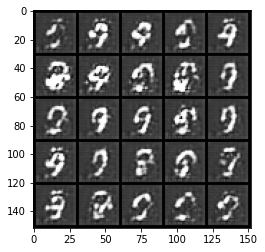

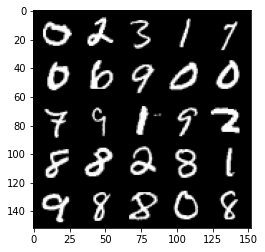

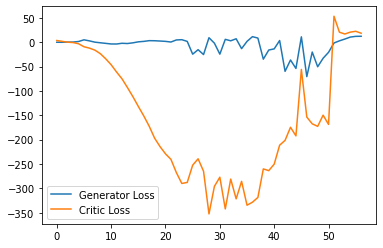

Step 1200: Generator loss: 13.362360363006593, critic loss: 10.076404682159422


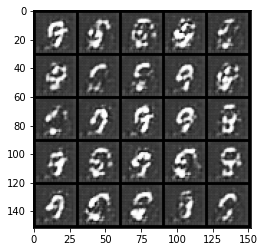

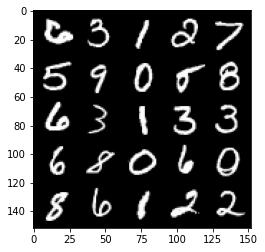

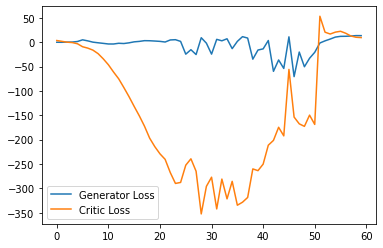

Step 1250: Generator loss: 12.092100811004638, critic loss: 14.972469036102298


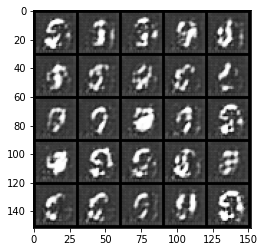

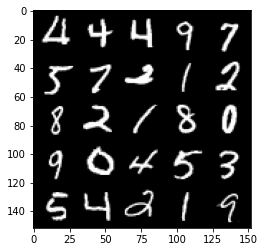

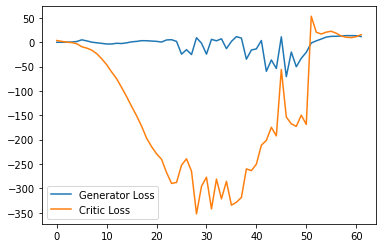

Step 1300: Generator loss: 9.229194297790528, critic loss: 24.243760128021236


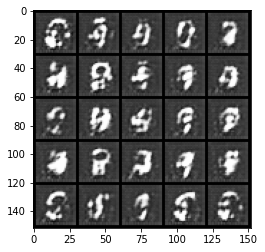

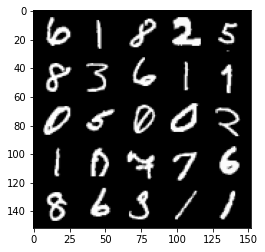

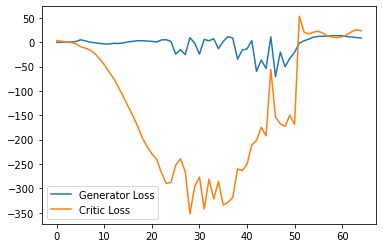

Step 1350: Generator loss: 7.911887941360473, critic loss: 27.020585586547863


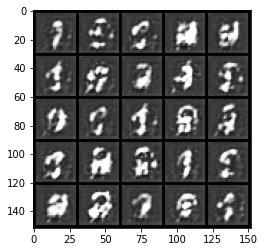

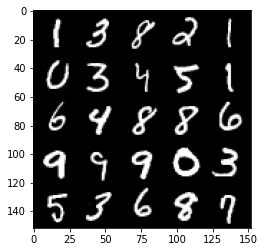

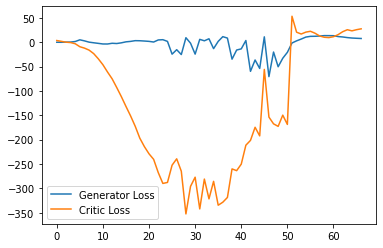

Step 1400: Generator loss: 7.480396070480347, critic loss: 25.672014396667475


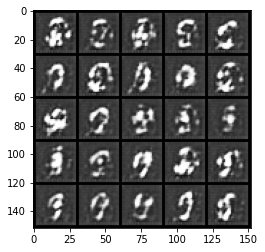

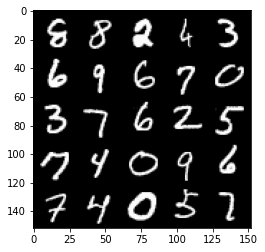

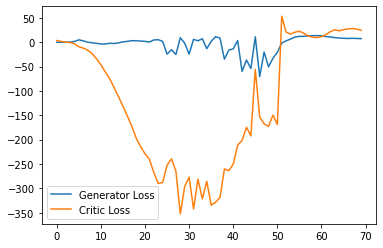

Step 1450: Generator loss: 7.37376802444458, critic loss: 19.229980888366697


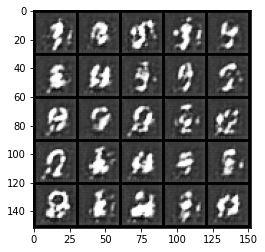

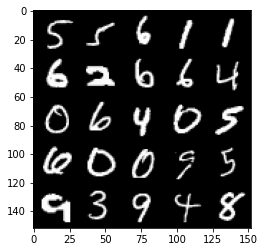

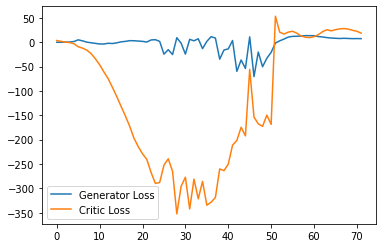

Step 1500: Generator loss: 8.522010021209717, critic loss: 7.695542697906493


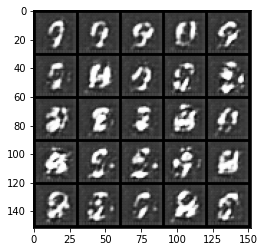

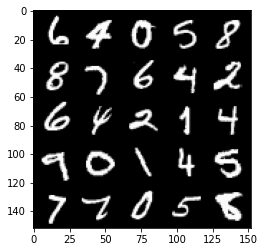

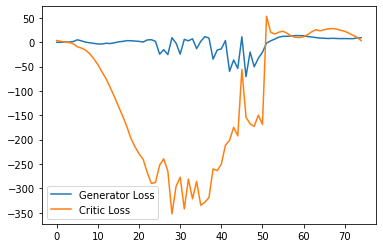

Step 1550: Generator loss: 9.47592321768403, critic loss: -4.288072410583497


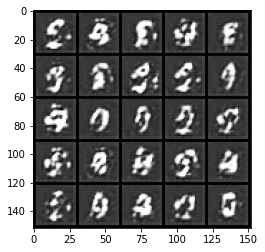

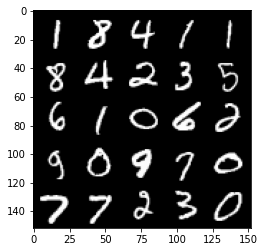

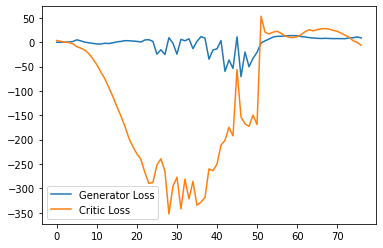

Step 1600: Generator loss: 12.247531950473785, critic loss: -14.703550224304202


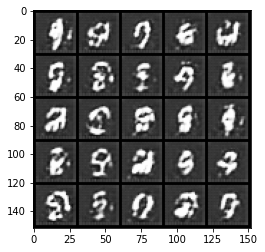

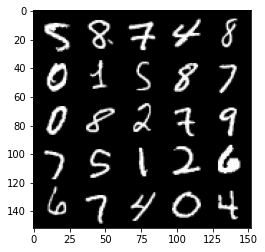

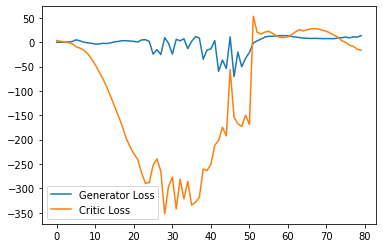

Step 1650: Generator loss: 16.45690110206604, critic loss: -21.62336863708496


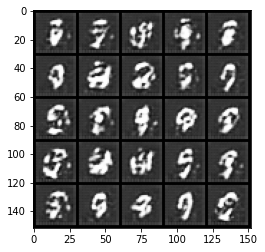

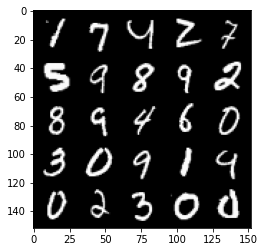

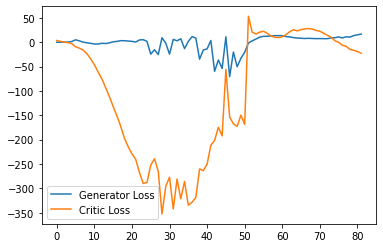

Step 1700: Generator loss: 16.70767275810242, critic loss: -24.89454064178467


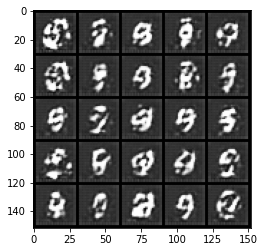

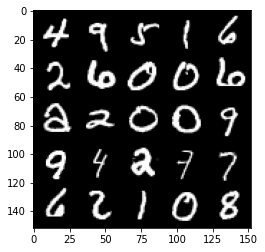

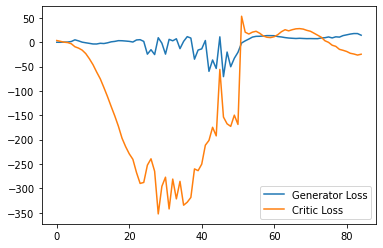

Step 1750: Generator loss: 18.713376858234405, critic loss: -29.185338111877442


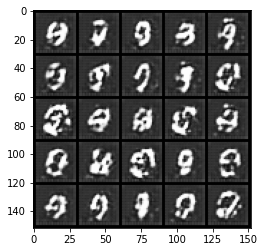

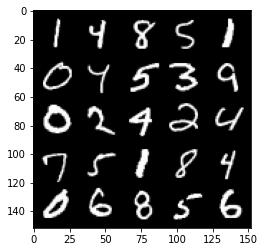

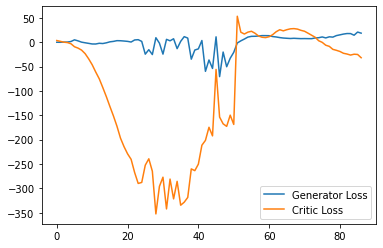

Step 1800: Generator loss: 18.79147220149636, critic loss: -32.37836918640137


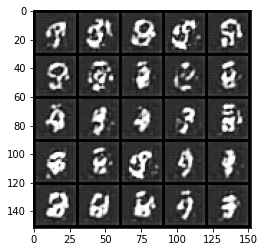

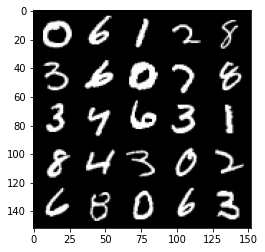

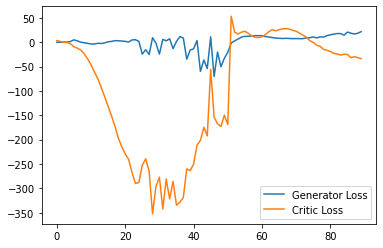

Step 1850: Generator loss: 20.07066969394684, critic loss: -34.33677798461915


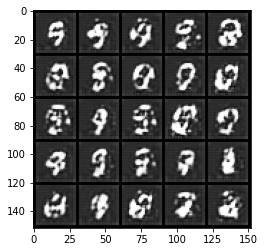

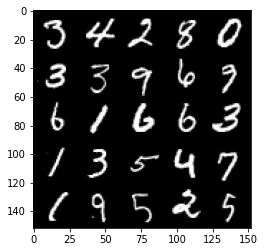

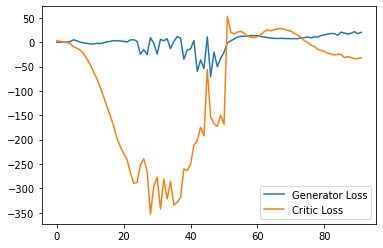

Step 1900: Generator loss: 20.611220140457153, critic loss: -33.76580562591553


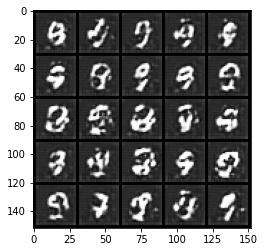

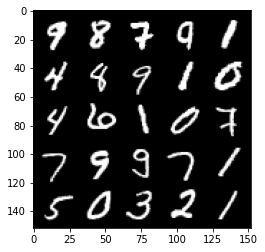

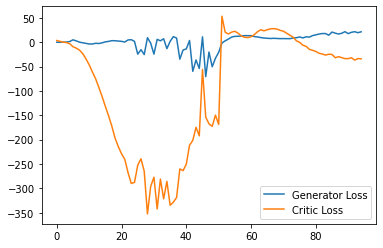

Step 1950: Generator loss: 21.36896706581116, critic loss: -31.56990163421631


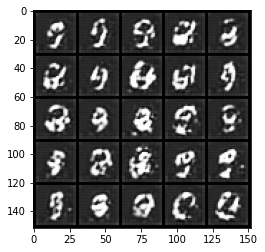

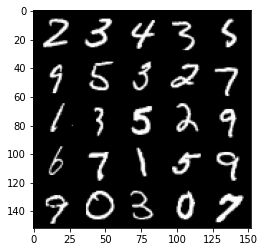

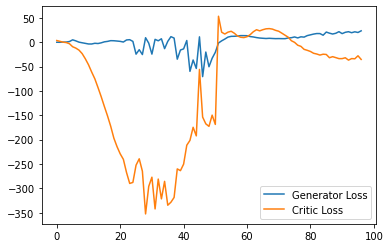

Step 2000: Generator loss: 21.000142658352853, critic loss: -10.448007639884946


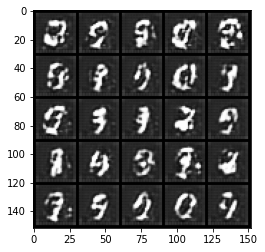

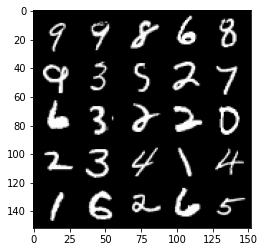

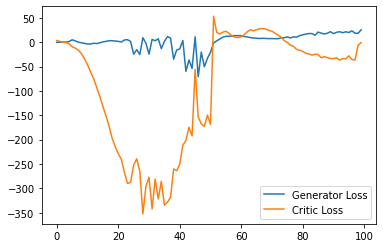

Step 2050: Generator loss: 19.241291732788085, critic loss: -18.13351868724823


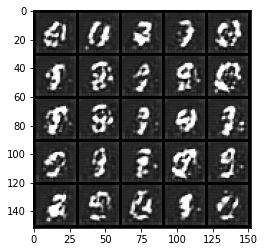

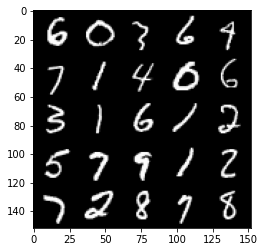

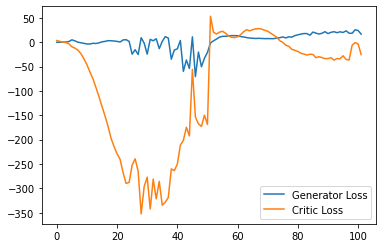

Step 2100: Generator loss: 18.243120193481445, critic loss: -23.83276333332061


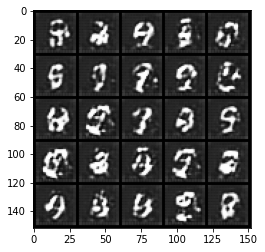

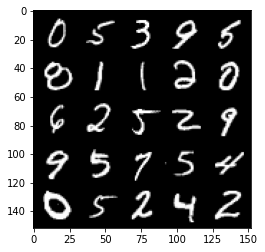

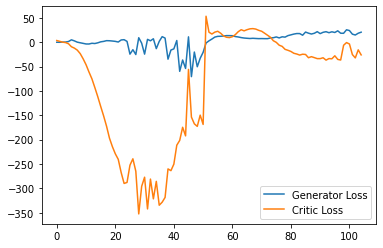

Step 2150: Generator loss: 18.69239353775978, critic loss: -30.838703468322755


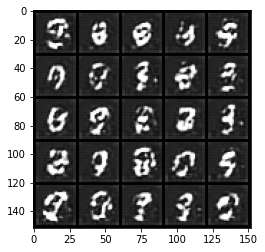

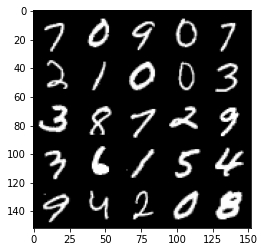

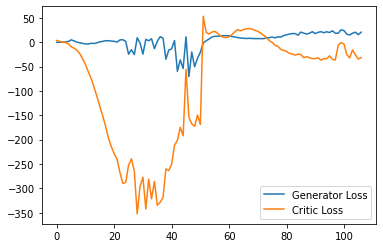

Step 2200: Generator loss: 18.739538812637328, critic loss: -22.447826659202573


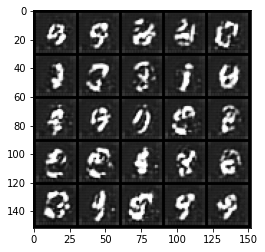

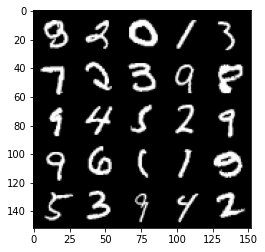

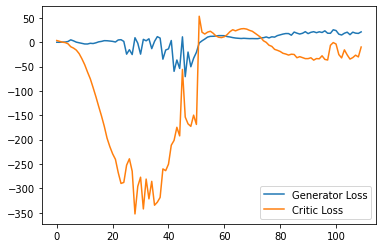

Step 2250: Generator loss: 17.091661901473998, critic loss: -27.941857418060305


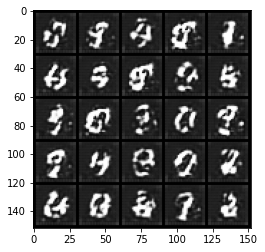

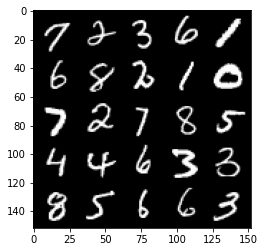

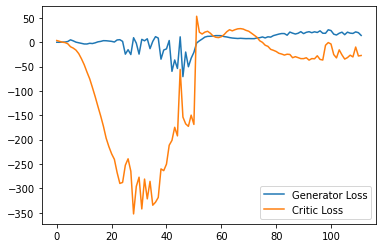

Step 2300: Generator loss: 18.111125583648683, critic loss: -24.338424497604368


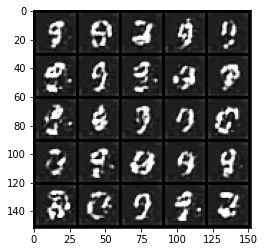

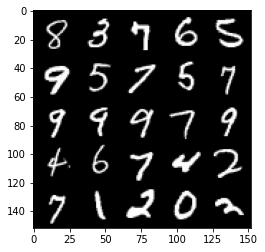

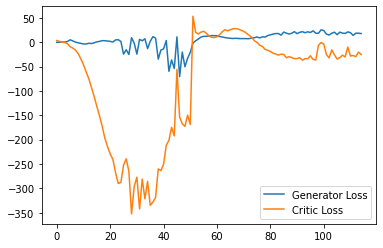

Step 2350: Generator loss: 15.560968197584153, critic loss: -21.27345114421845


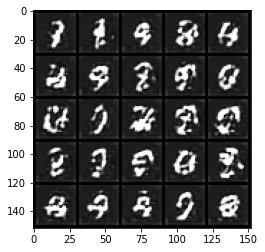

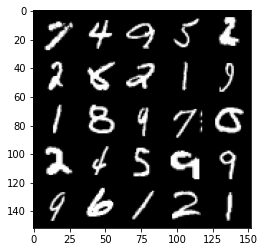

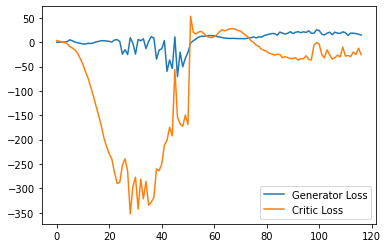

Step 2400: Generator loss: 19.608787813186645, critic loss: -12.612647795677185


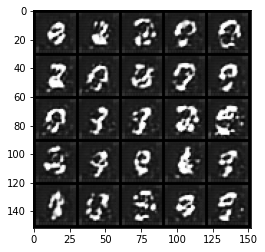

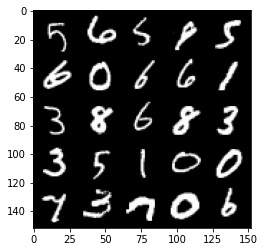

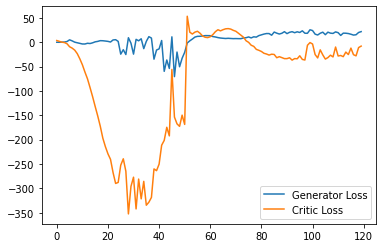

Step 2450: Generator loss: 10.56168206691742, critic loss: -27.09693584251404


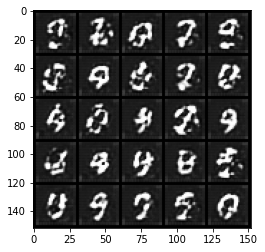

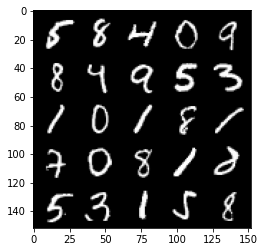

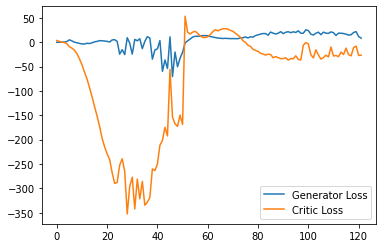

Step 2500: Generator loss: 15.612499837875367, critic loss: -17.599128810882565


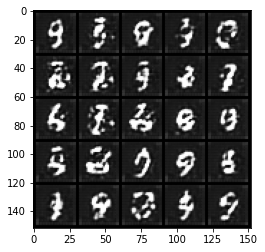

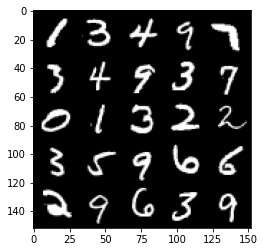

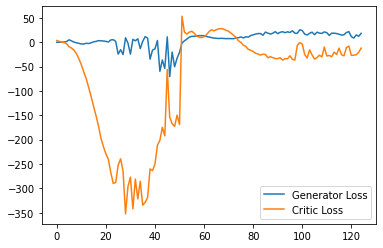

Step 2550: Generator loss: 15.69633175611496, critic loss: -15.540199391365052


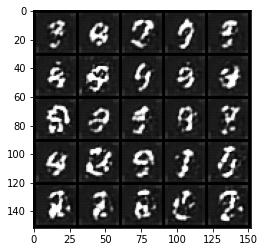

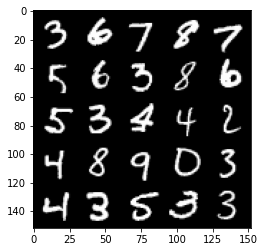

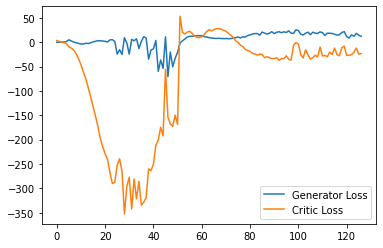

Step 2600: Generator loss: 24.24162479400635, critic loss: -0.5631510848999023


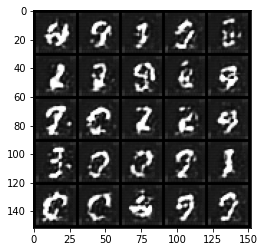

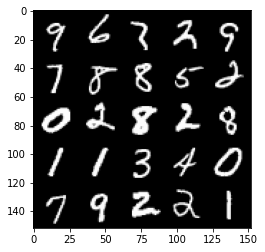

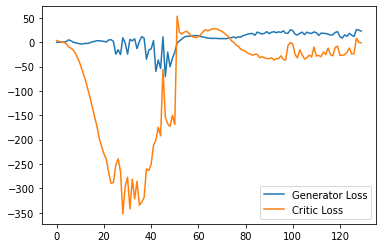

Step 2650: Generator loss: 18.45452419281006, critic loss: -1.9868590879440302


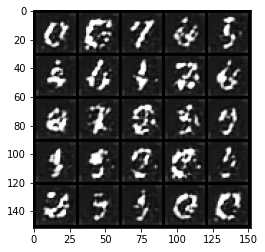

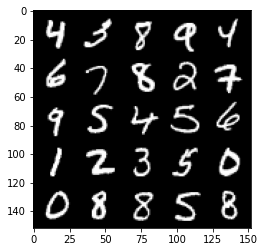

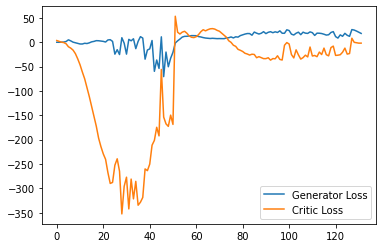

Step 2700: Generator loss: 12.424888191223145, critic loss: -5.256947484970093


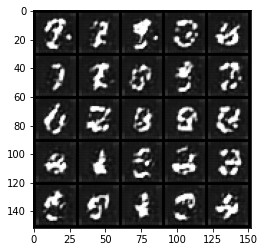

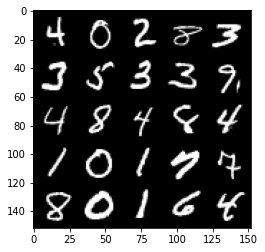

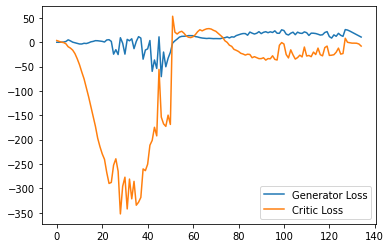

Step 2750: Generator loss: 10.119116735458373, critic loss: -14.569010065078732


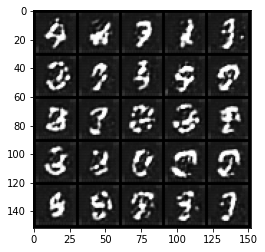

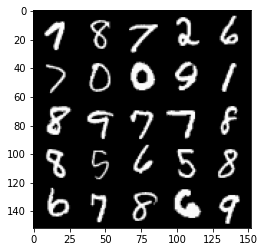

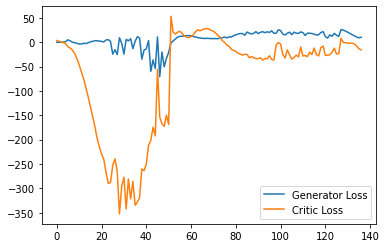

Step 2800: Generator loss: 12.745137304365635, critic loss: -18.687559562683106


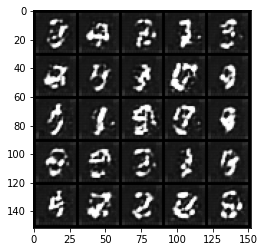

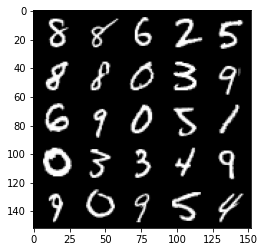

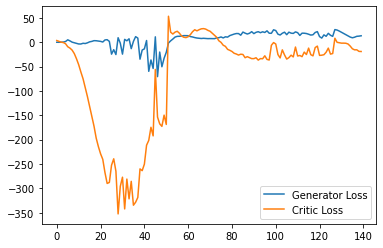

Step 2850: Generator loss: 14.657408833503723, critic loss: -18.640076014518737


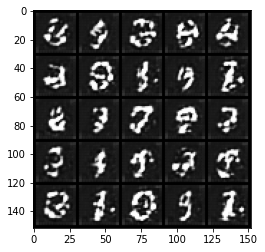

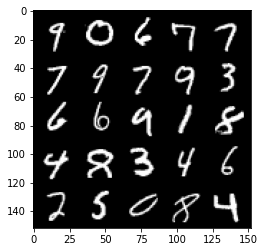

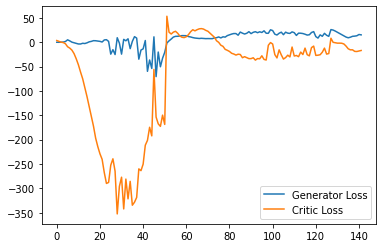

Step 2900: Generator loss: 15.183548421859742, critic loss: -19.683206536293028


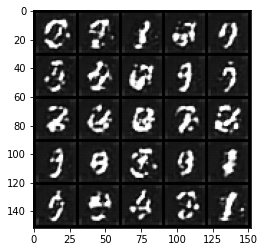

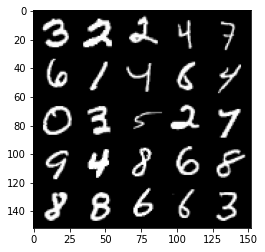

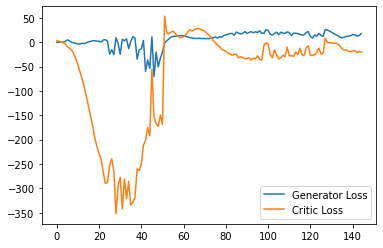

Step 2950: Generator loss: 14.989145641326905, critic loss: -16.733041100502017


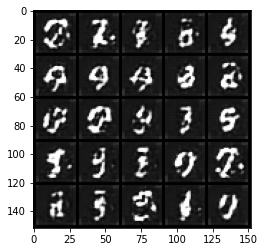

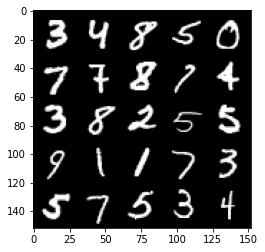

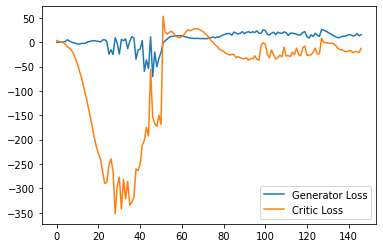

Step 3000: Generator loss: 16.72429494857788, critic loss: -16.036638836383812


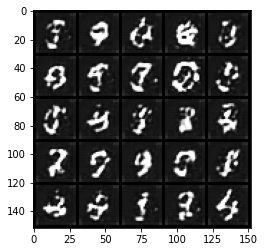

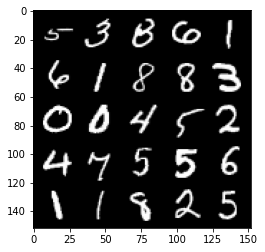

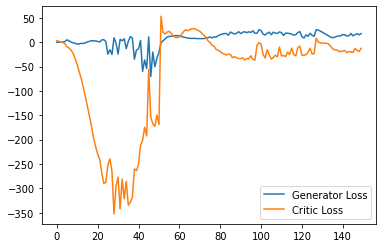

Step 3050: Generator loss: 20.75518995285034, critic loss: -5.888246016025544


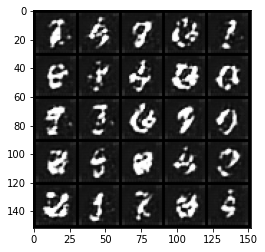

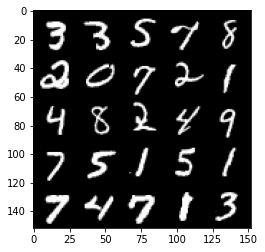

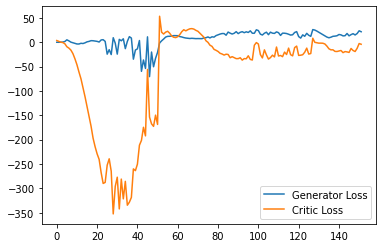

Step 3100: Generator loss: 16.074638500213624, critic loss: -14.568003081321713


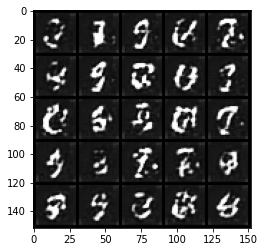

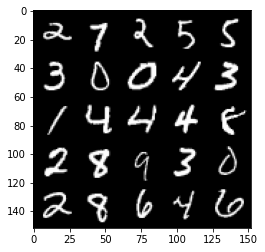

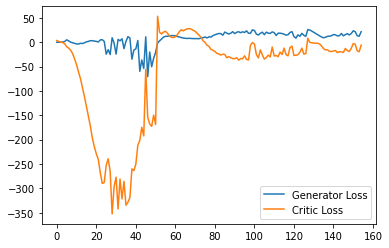

Step 3150: Generator loss: 14.154361515045165, critic loss: -20.40217478561401


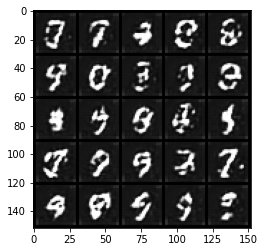

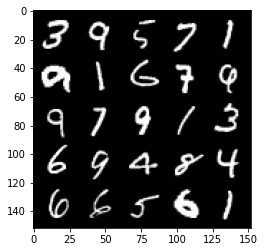

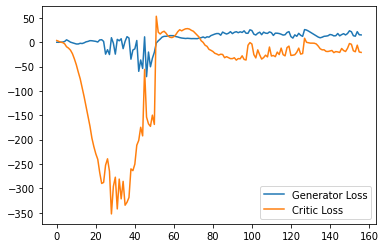

Step 3200: Generator loss: 15.293480467796325, critic loss: -17.863823307991023


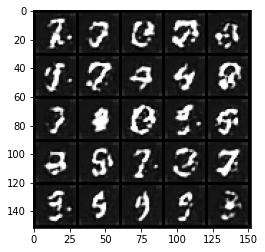

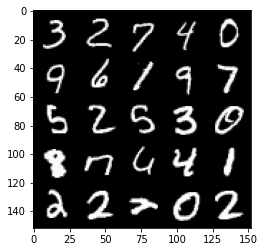

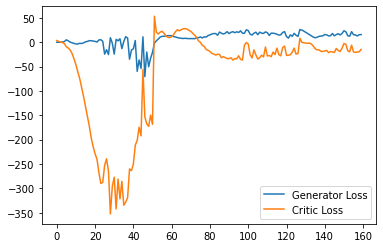

Step 3250: Generator loss: 14.504308471679687, critic loss: -20.72144867992401


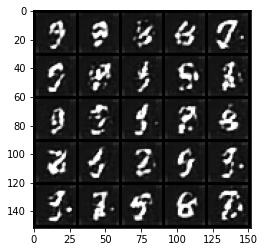

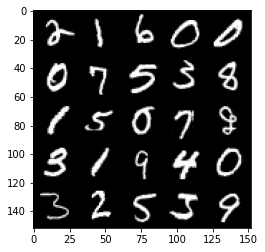

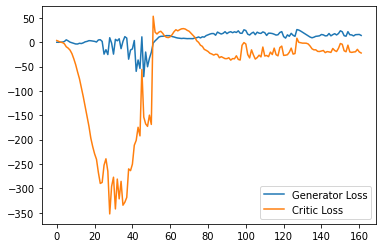

Step 3300: Generator loss: 18.680699501037598, critic loss: -8.856486412525177


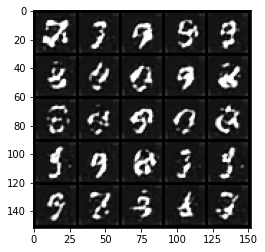

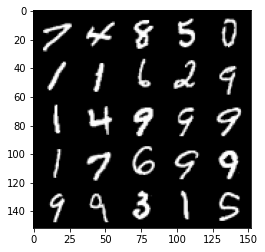

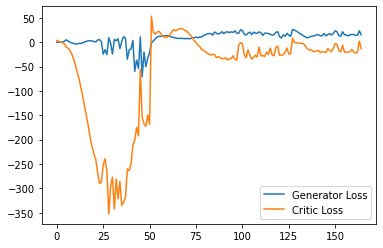

Step 3350: Generator loss: 15.092531659603118, critic loss: -18.370081968307492


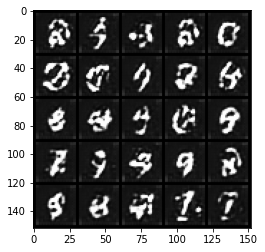

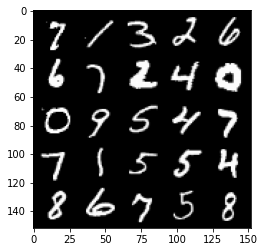

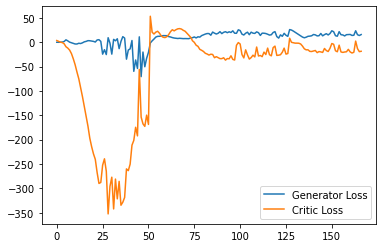

Step 3400: Generator loss: 15.131220903396606, critic loss: -20.41860824203491


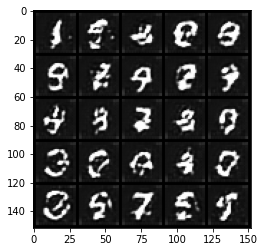

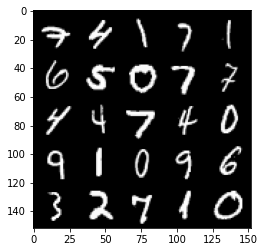

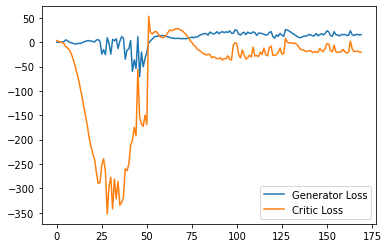

Step 3450: Generator loss: 16.158016748428345, critic loss: -18.733321767807016


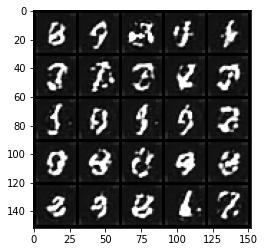

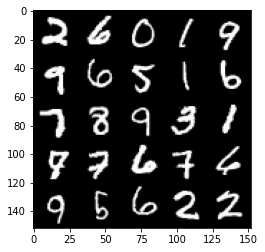

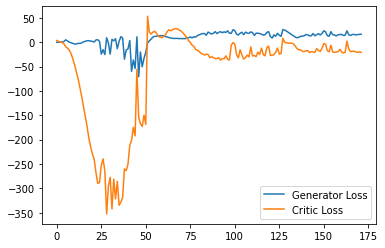

Step 3500: Generator loss: 16.44027669906616, critic loss: -19.272308708190913


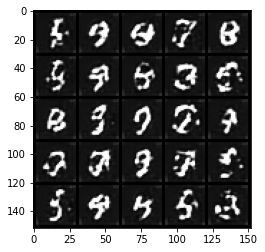

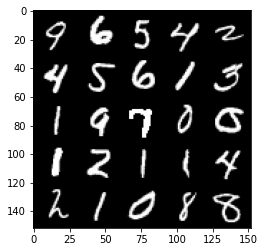

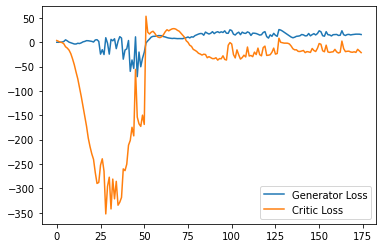

Step 3550: Generator loss: 22.090166416168213, critic loss: -7.493927022933961


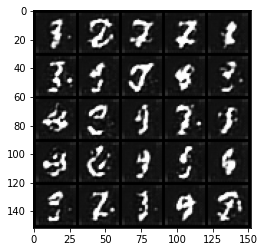

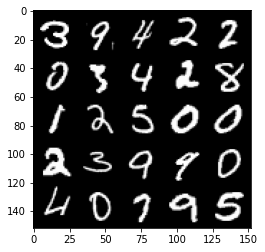

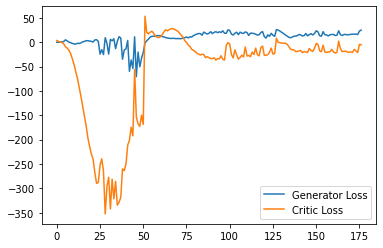

Step 3600: Generator loss: 13.865751089155674, critic loss: -20.233733234405516


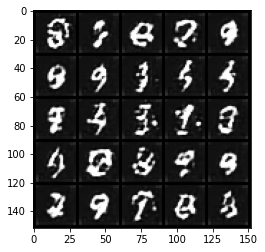

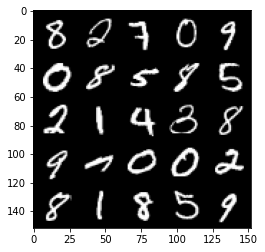

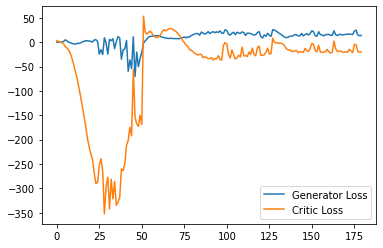

Step 3650: Generator loss: 24.727278633117677, critic loss: -3.612572327613831


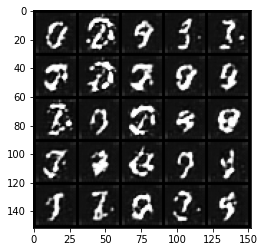

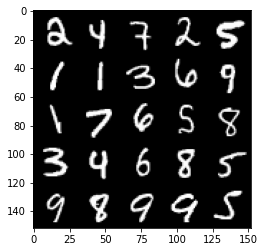

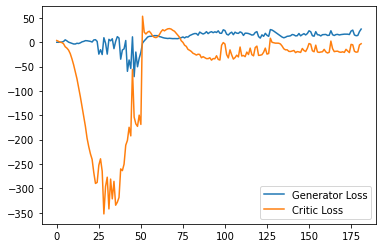

Step 3700: Generator loss: 18.76287983894348, critic loss: -11.212735571861266


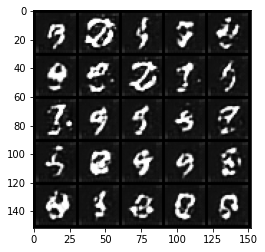

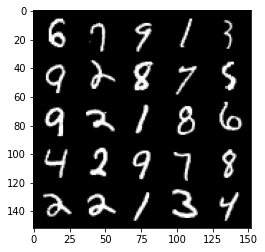

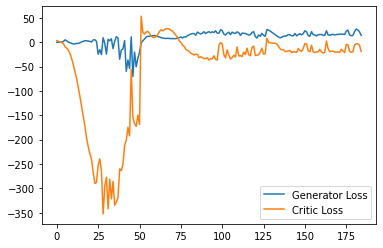

Step 3750: Generator loss: 15.698331661224366, critic loss: -19.77539068984985


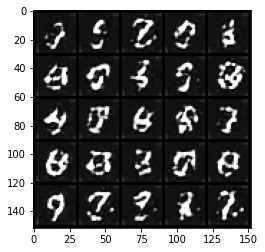

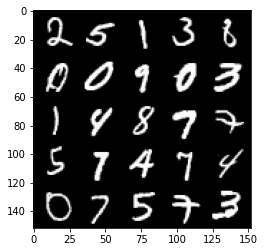

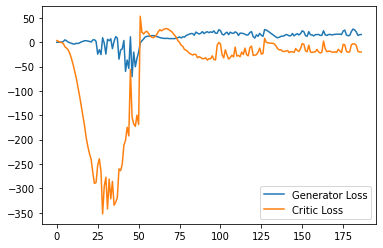

Step 3800: Generator loss: 18.455514822006226, critic loss: -12.33856700325013


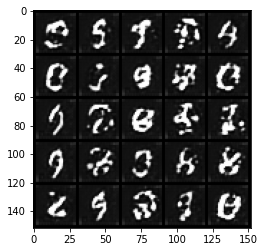

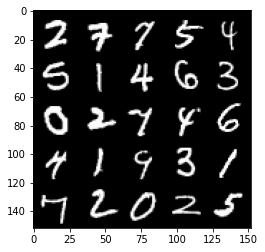

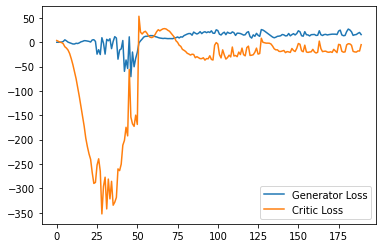

Step 3850: Generator loss: 25.951367454528807, critic loss: -2.0978887963294985


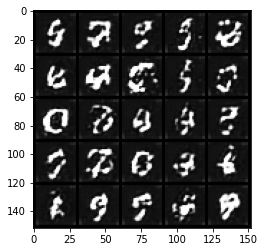

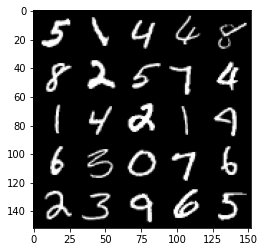

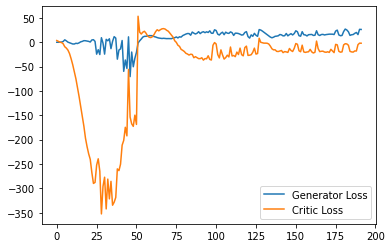

Step 3900: Generator loss: 22.03783893585205, critic loss: -2.3099814586639407


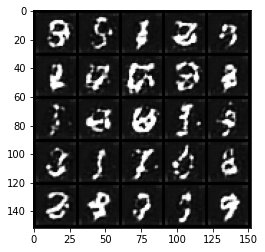

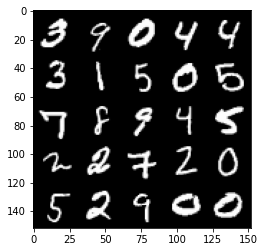

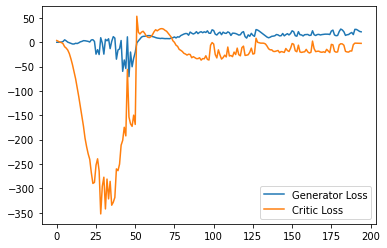

Step 3950: Generator loss: 19.331483459472658, critic loss: -2.7630356879234315


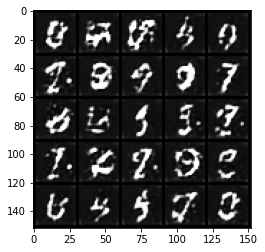

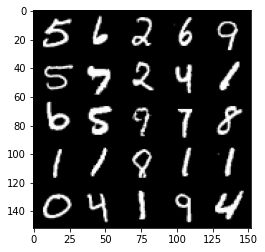

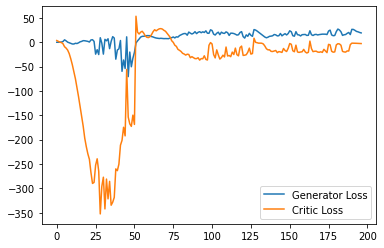

Step 4000: Generator loss: 17.59043315887451, critic loss: -3.9479017477035527


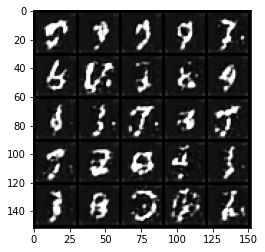

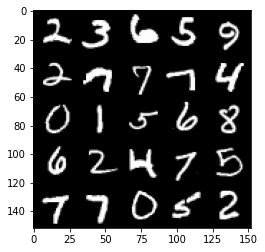

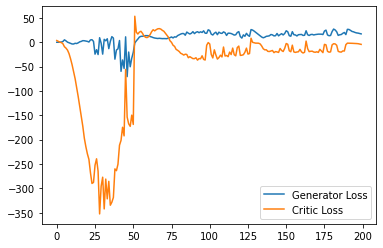

Step 4050: Generator loss: 14.800894918441772, critic loss: -8.873115049362182


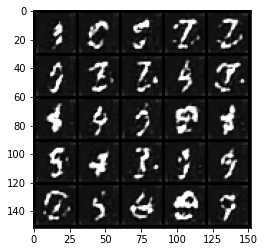

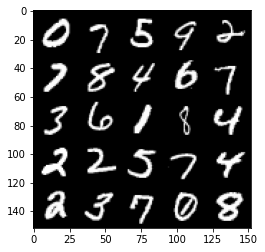

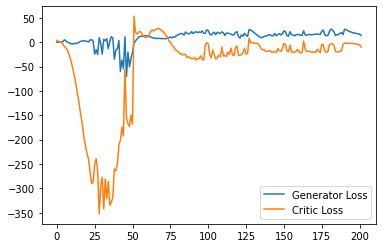

Step 4100: Generator loss: 16.197462282180787, critic loss: -11.972473568916323


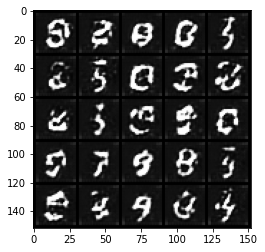

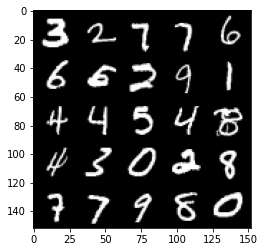

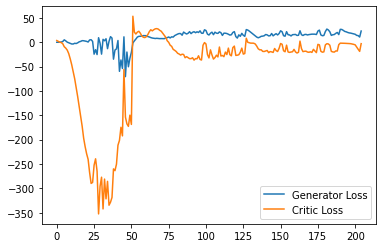

Step 4150: Generator loss: 14.348799977302551, critic loss: -16.4503780670166


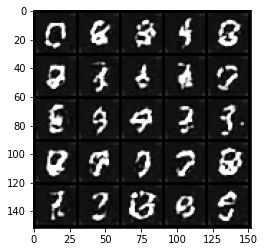

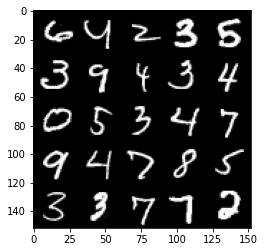

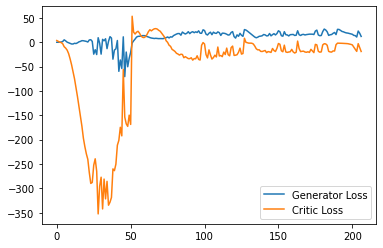

Step 4200: Generator loss: 15.333562726974487, critic loss: -13.730320134639735


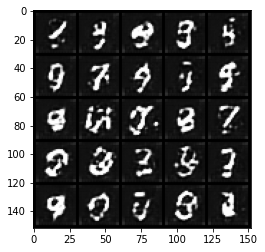

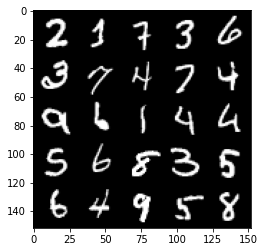

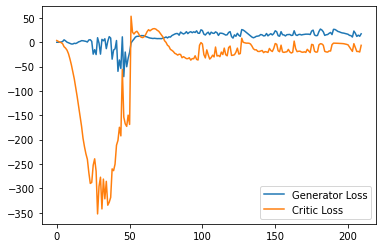

Step 4250: Generator loss: 26.33465835571289, critic loss: -2.863148559570313


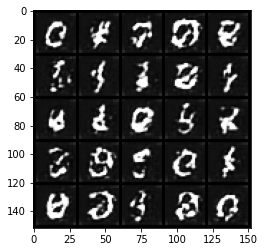

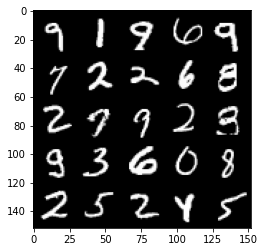

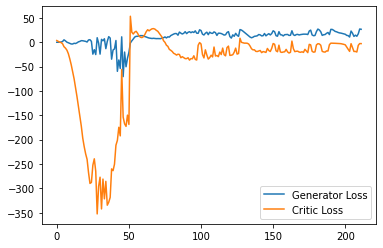

Step 4300: Generator loss: 22.854154052734376, critic loss: -3.3441505498886106


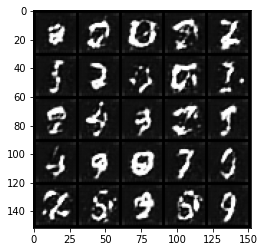

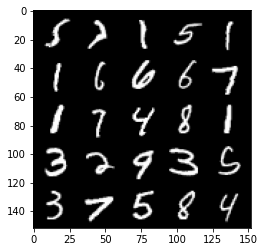

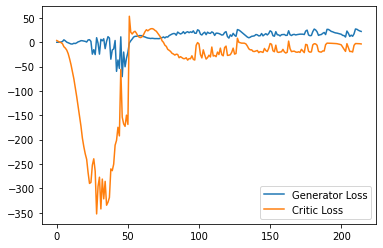

Step 4350: Generator loss: 14.567561659812927, critic loss: -11.873058519363406


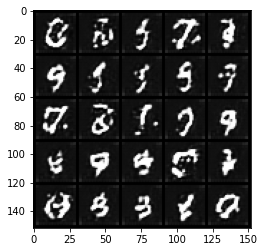

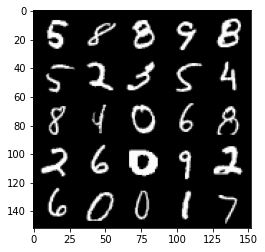

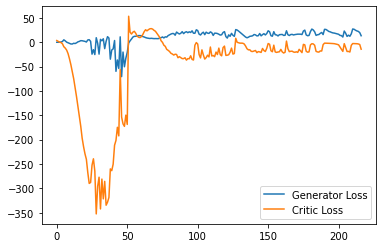

Step 4400: Generator loss: 13.532524585723877, critic loss: -14.131964396476748


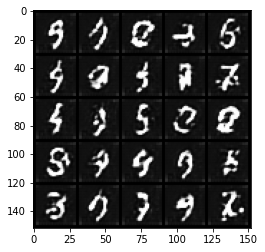

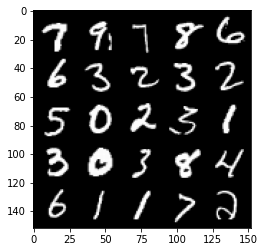

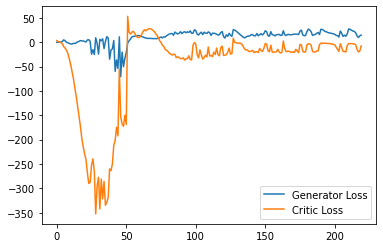

Step 4450: Generator loss: 26.318936195373535, critic loss: -3.436426523208618


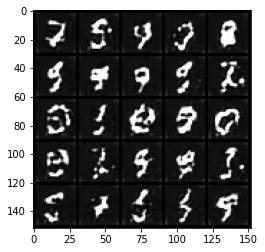

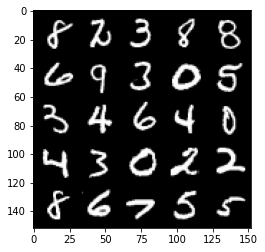

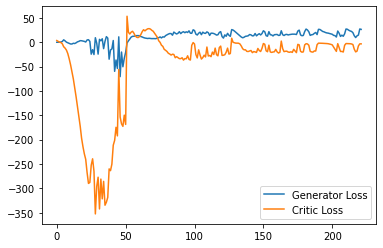

Step 4500: Generator loss: 19.330492324829102, critic loss: -8.543244883537291


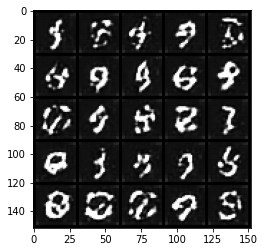

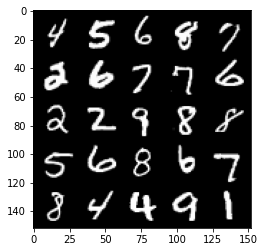

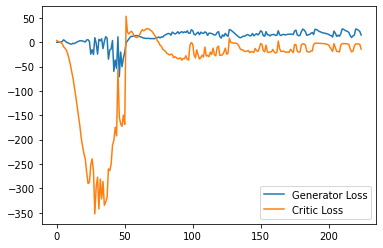

Step 4550: Generator loss: 13.641297664642334, critic loss: -21.104569090843196


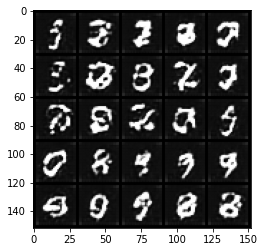

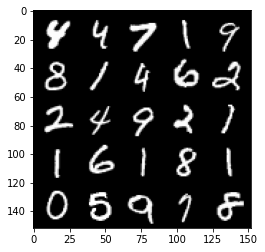

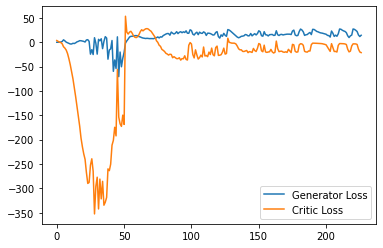

Step 4600: Generator loss: 21.177060813903807, critic loss: -9.776851826667787


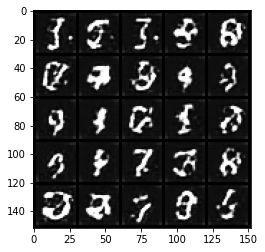

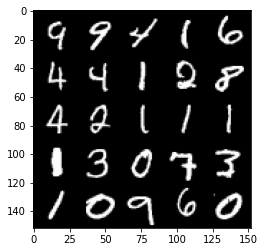

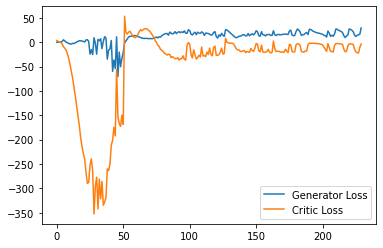

Step 4650: Generator loss: 19.740867490768434, critic loss: -12.121136398315427


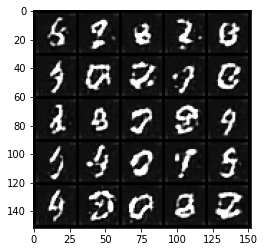

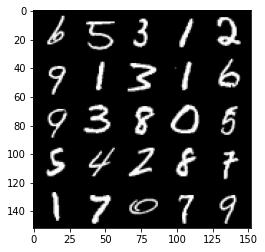

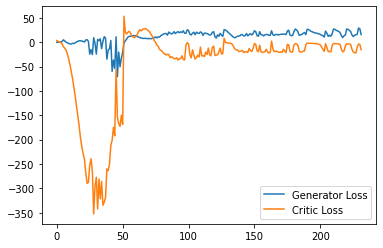

Step 4700: Generator loss: 16.94881591796875, critic loss: -20.38339096546173


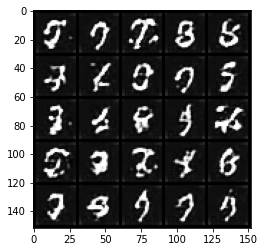

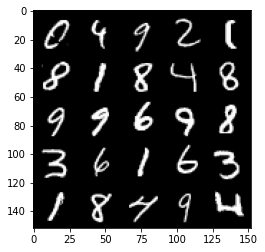

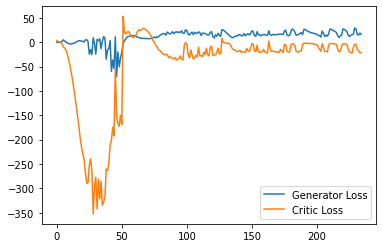

Step 4750: Generator loss: 22.345576095581055, critic loss: -13.314407838821412


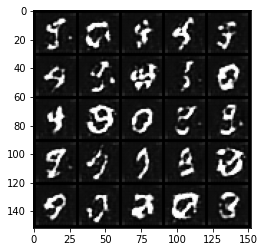

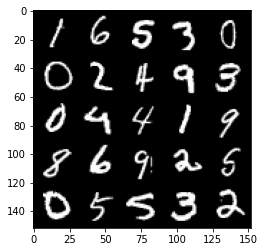

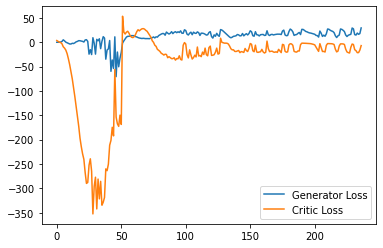

Step 4800: Generator loss: 17.159580059051514, critic loss: -17.62348113393783


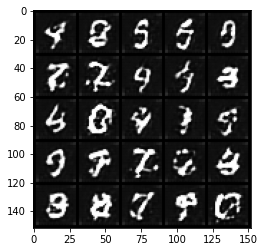

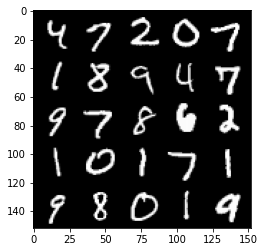

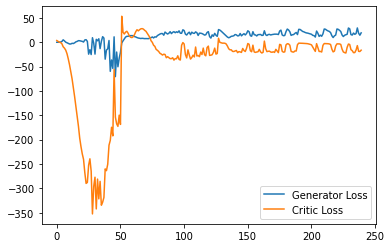

Step 4850: Generator loss: 16.92737482070923, critic loss: -21.143823659896853


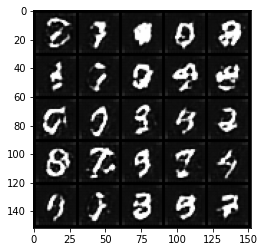

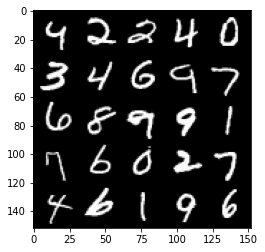

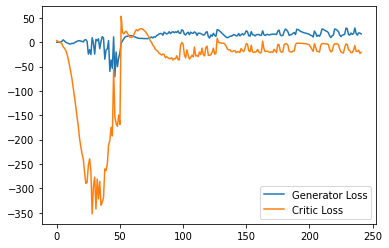

Step 4900: Generator loss: 19.455667247772215, critic loss: -16.06844020271301


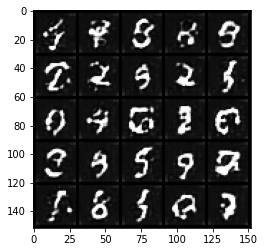

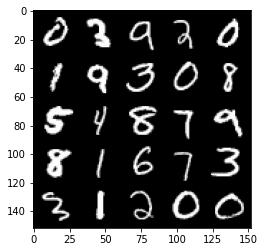

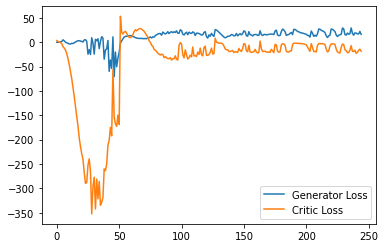

Step 4950: Generator loss: 21.114654178619386, critic loss: -17.39015265607834


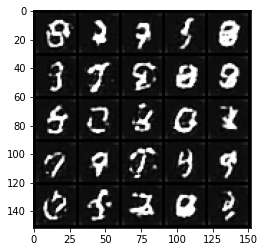

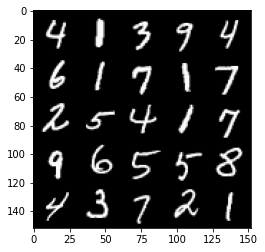

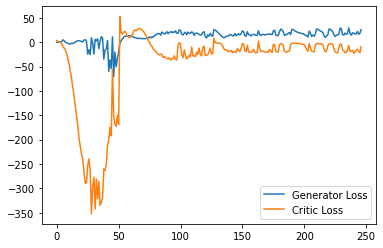

Step 5000: Generator loss: 22.78871911048889, critic loss: -3.429356253147127


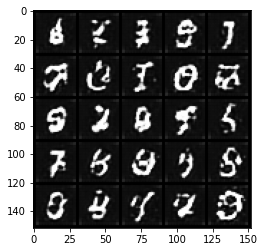

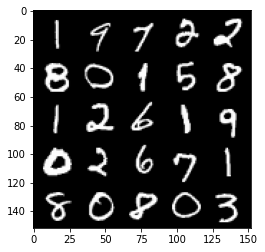

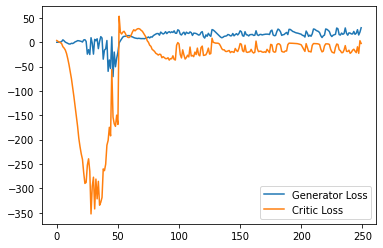

Step 5050: Generator loss: 27.82542507171631, critic loss: -2.5031941599845884


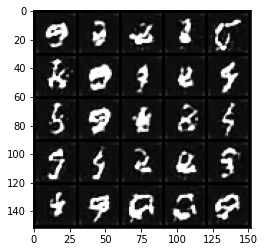

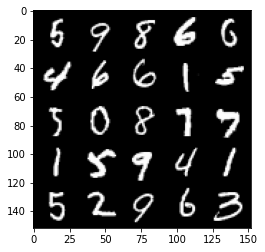

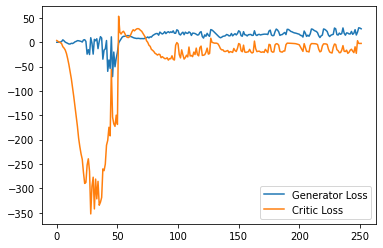

Step 5100: Generator loss: 26.00128162384033, critic loss: -2.7789873752593985


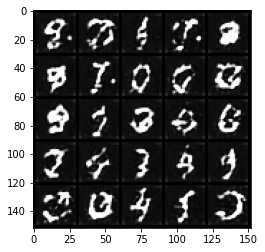

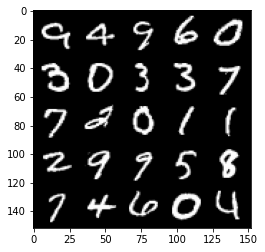

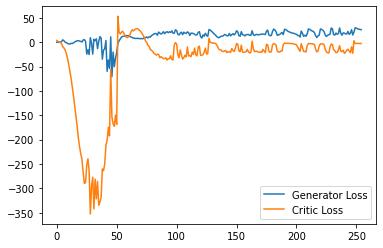

Step 5150: Generator loss: 24.5063667678833, critic loss: -3.400450952529907


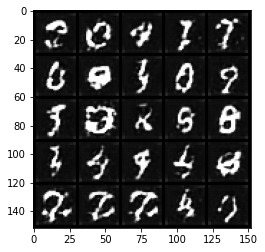

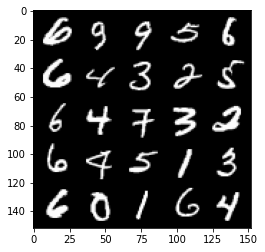

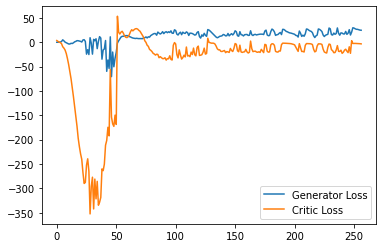

Step 5200: Generator loss: 22.5010888671875, critic loss: -3.83212725353241


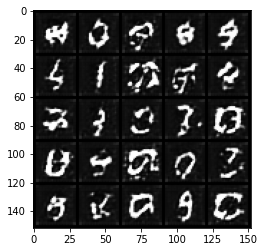

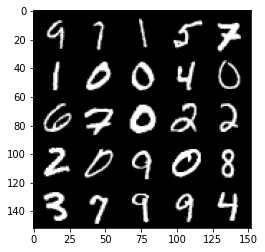

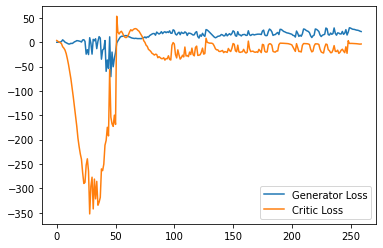

Step 5250: Generator loss: 21.143234519958497, critic loss: -5.9732910871505736


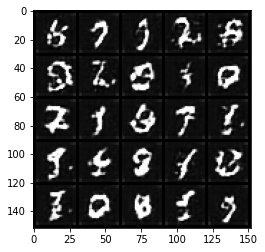

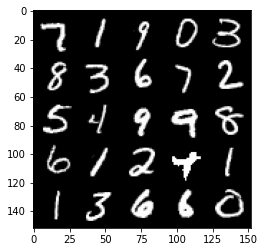

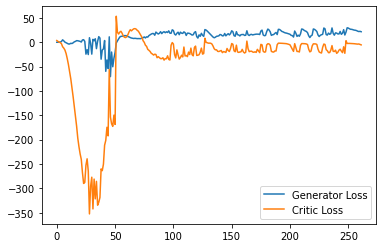

Step 5300: Generator loss: 19.522587413787843, critic loss: -5.4647592210769655


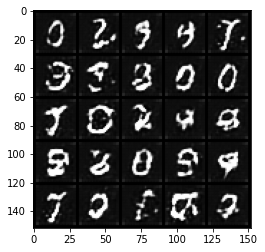

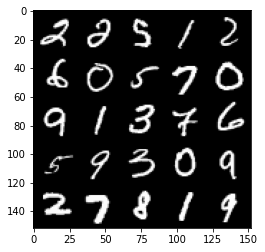

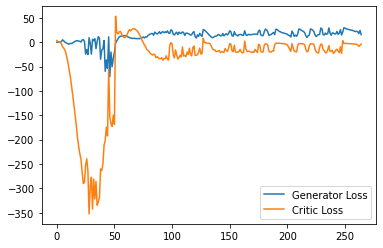

Step 5350: Generator loss: 27.694808578491212, critic loss: -2.401607367515564


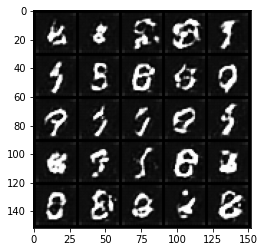

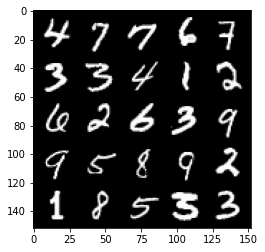

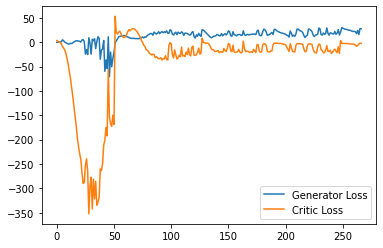

Step 5400: Generator loss: 26.641174507141113, critic loss: -2.7696280393600468


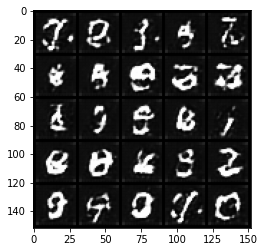

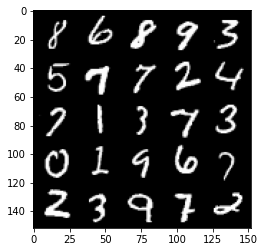

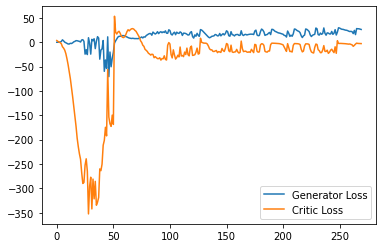

Step 5450: Generator loss: 25.503378448486327, critic loss: -3.2891288986206053


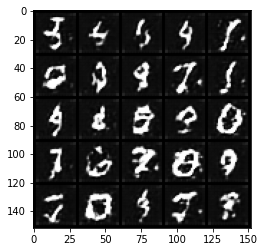

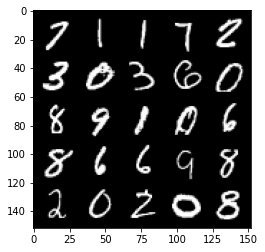

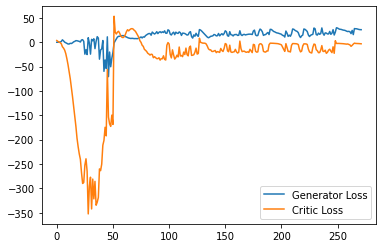

Step 5500: Generator loss: 22.162433891296388, critic loss: -7.085056418418886


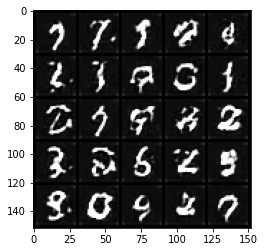

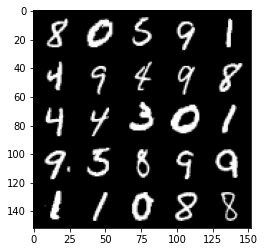

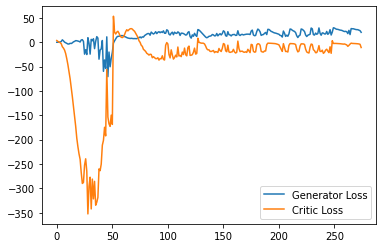

Step 5550: Generator loss: 19.236758613586424, critic loss: -13.797039079189299


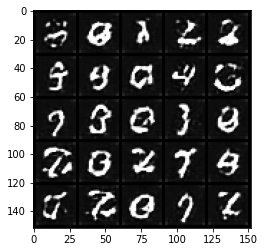

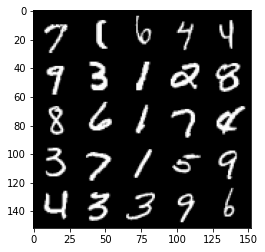

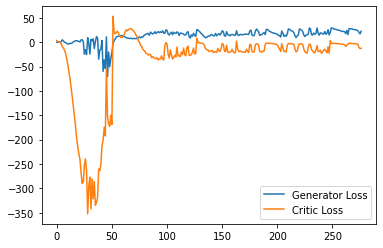

Step 5600: Generator loss: 18.06293289899826, critic loss: -19.62530852508545


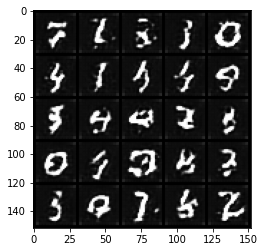

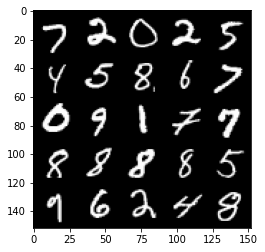

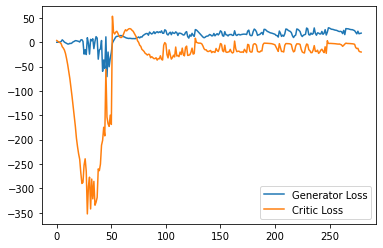

Step 5650: Generator loss: 27.838207149505614, critic loss: 1.3310315985679622


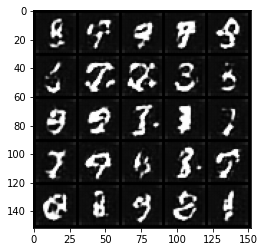

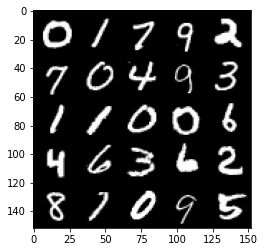

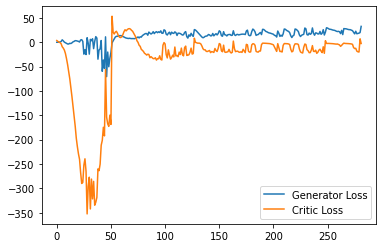

Step 5700: Generator loss: 30.01286808013916, critic loss: -2.817073976516724


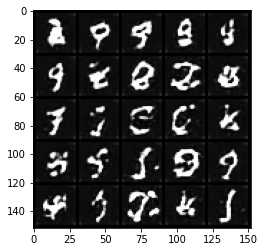

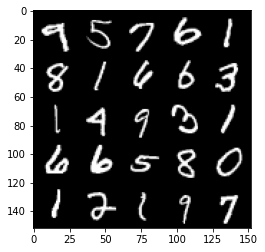

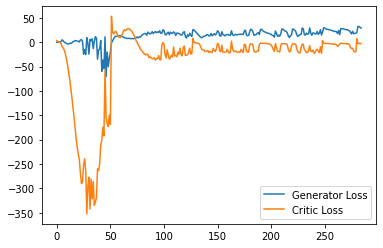

Step 5750: Generator loss: 27.399707946777344, critic loss: -3.1052377080917357


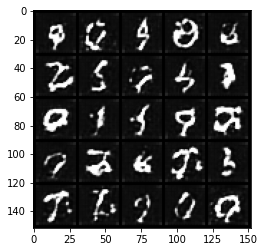

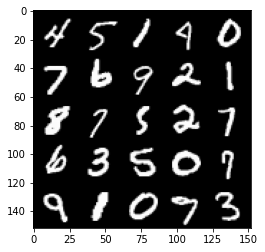

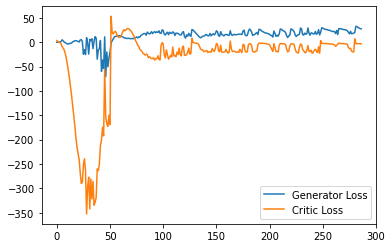

Step 5800: Generator loss: 26.55234161376953, critic loss: -3.0902199130058294


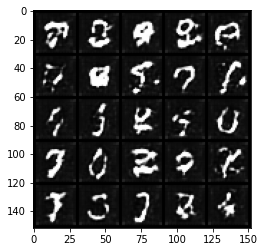

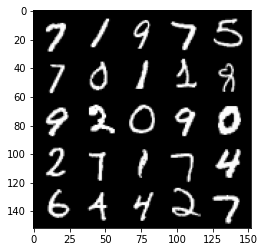

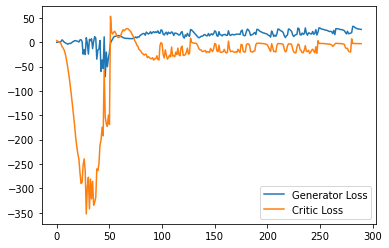

Step 5850: Generator loss: 25.751783752441405, critic loss: -3.2244684696197505


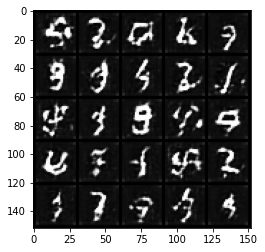

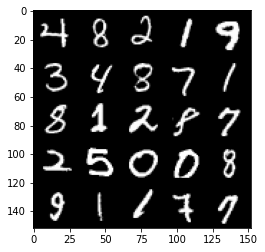

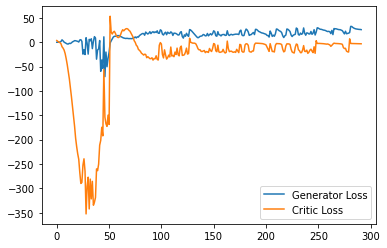

Step 5900: Generator loss: 22.56544044494629, critic loss: -2.569101115703581


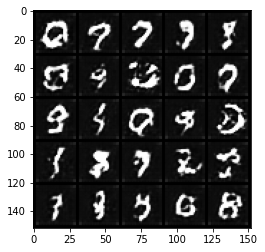

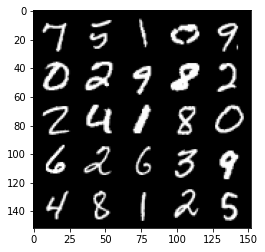

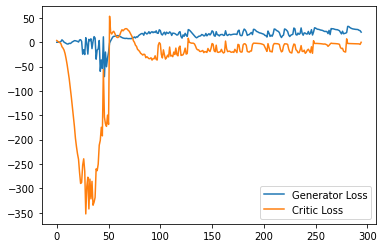

Step 5950: Generator loss: 29.167513389587402, critic loss: -2.681368663787842


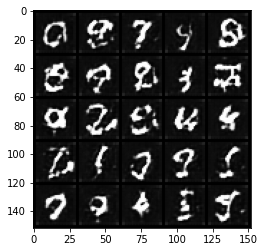

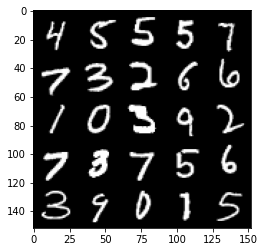

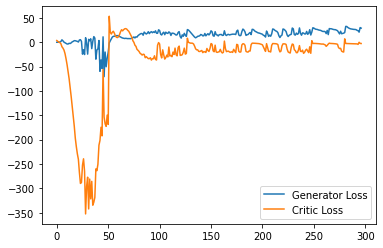

Step 6000: Generator loss: 26.474050827026367, critic loss: -3.100591180324553


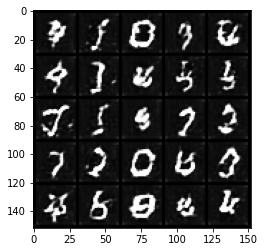

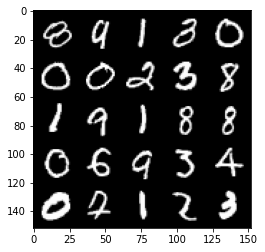

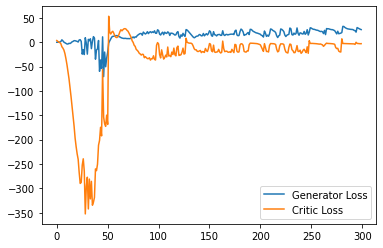

Step 6050: Generator loss: 26.886907386779786, critic loss: -3.6871241884231565


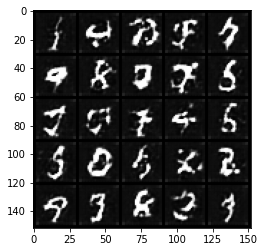

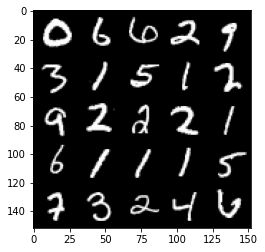

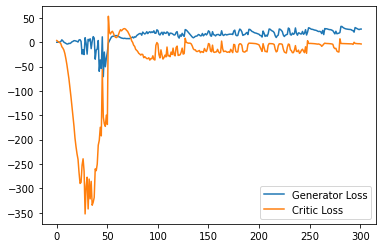

Step 6100: Generator loss: 18.66919235229492, critic loss: -15.365276227951046


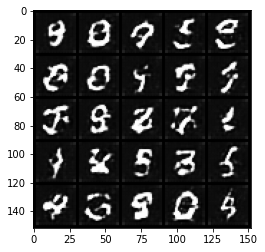

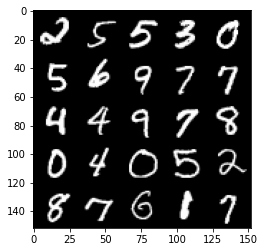

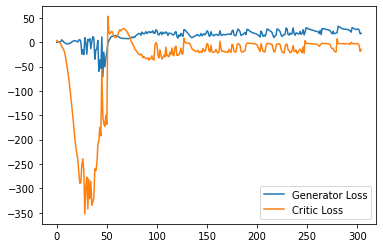

Step 6150: Generator loss: 20.62504280090332, critic loss: -18.95977196741104


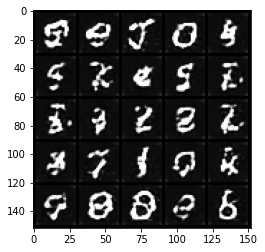

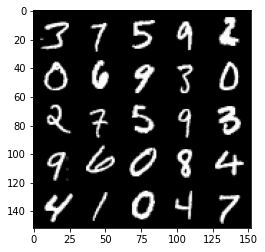

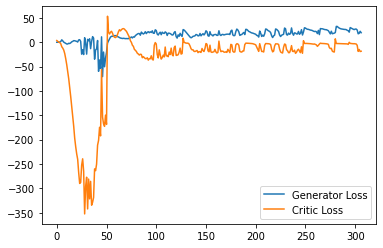

Step 6200: Generator loss: 20.840001525878908, critic loss: -16.098910896778104


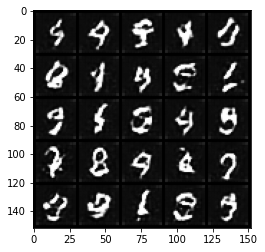

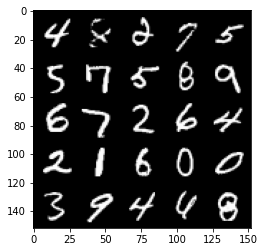

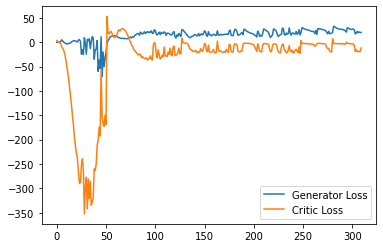

Step 6250: Generator loss: 32.87885021209717, critic loss: -3.6450040922164924


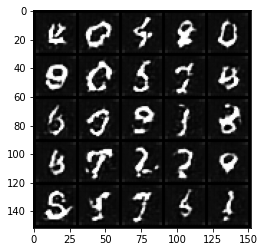

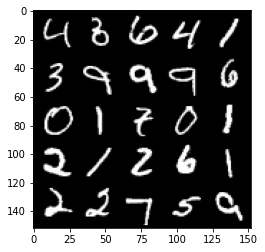

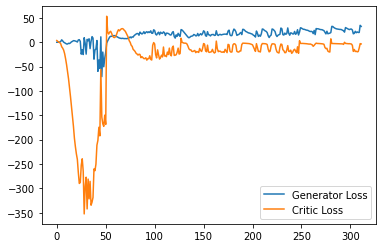

Step 6300: Generator loss: 21.640372524261476, critic loss: -12.389790035247803


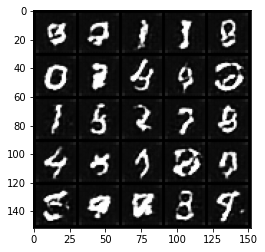

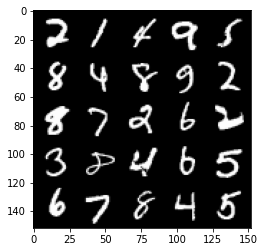

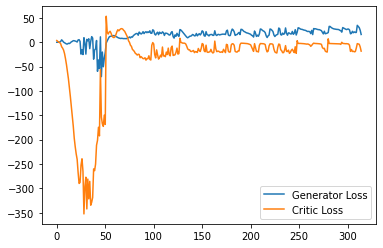

Step 6350: Generator loss: 20.415599327087403, critic loss: -17.914482752323153


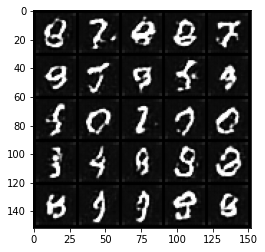

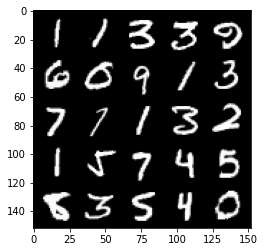

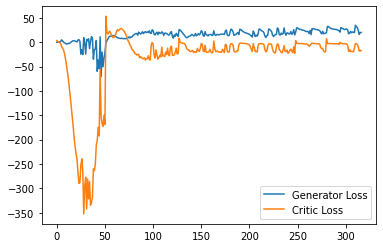

Step 6400: Generator loss: 20.311697444915772, critic loss: -13.514983853816986


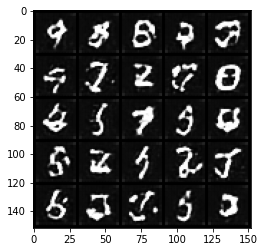

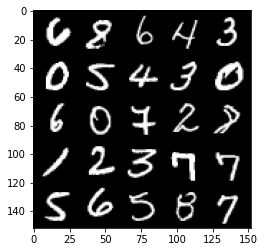

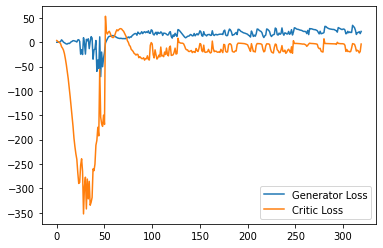

Step 6450: Generator loss: 25.631346397399902, critic loss: -10.055547939777371


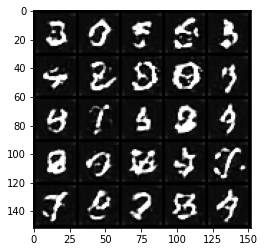

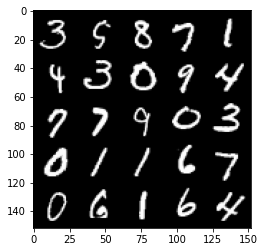

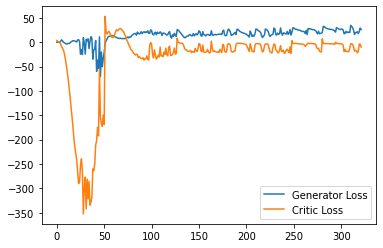

Step 6500: Generator loss: 20.390444145202636, critic loss: -17.013210662841804


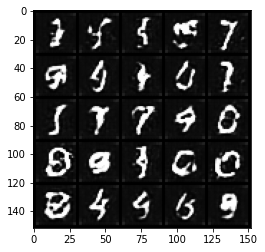

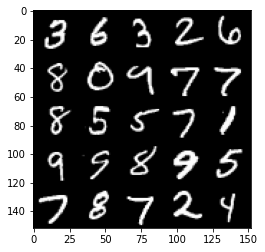

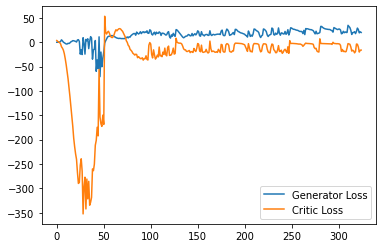

In [ ]:
import matplotlib.pyplot as plt

cur_step = 0
generator_losses = []
critic_losses = []
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        mean_iteration_critic_loss = 0
        for _ in range(crit_repeats):
            ### Update critic ###
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Keep track of the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()
        critic_losses += [mean_iteration_critic_loss]

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update the weights
        gen_opt.step()

        # Keep track of the average generator loss
        generator_losses += [gen_loss.item()]

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            gen_mean = sum(generator_losses[-display_step:]) / display_step
            crit_mean = sum(critic_losses[-display_step:]) / display_step
            print(f"Step {cur_step}: Generator loss: {gen_mean}, critic loss: {crit_mean}")
            show_tensor_images(fake)
            show_tensor_images(real)
            step_bins = 20
            num_examples = (len(generator_losses) // step_bins) * step_bins
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(generator_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Generator Loss"
            )
            plt.plot(
                range(num_examples // step_bins), 
                torch.Tensor(critic_losses[:num_examples]).view(-1, step_bins).mean(1),
                label="Critic Loss"
            )
            plt.legend()
            plt.show()

        cur_step += 1
